# *Data Science @ Sofía Challenge*
Author: Aquiles Martinez Berrios

## **Challenge**: Reaching longevity escape velocity

### Skills to be tested:

- Data-eng skills
- Predictive modelling
- Data visualisation

Source: https://sofiasalud.notion.site/Data-Science-Sof-a-Challenge-779373cfc48f4164ac51c852697b32dc

# Instalar dependencias

In [ ]:
!pip3 install gdown
!pip3 install statsmodels
!pip3 install xgboost

# 1. Procesamiento de datos

## 1.1 Descarga de datos desde Google Drive

In [79]:
import gdown
from pathlib import Path

# Ruta del archivo ZIP
root_path = Path.home() / 'Downloads/Sofia_Healthcare/'

# URL del archivo en Google Drive
data_url = 'https://drive.google.com/file/d/1h5HzAH7T6GRsFP1digTE4vpkmKizP_R5/view?usp=sharing'
data_zip_file_path = str(root_path / 'vo2_max_data.zip')

# Descargar el archivo
gdown.download(data_url, data_zip_file_path, quiet=False, fuzzy=True)


## 1.2 Descompresion de archivo ZIP descargado de Google Drive

In [ ]:
import zipfile

# Descomprimir el archivo
with zipfile.ZipFile(data_zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(root_path)

## 1.3 Identificacion de archivos JSON en la carpeta descomprimida

In [80]:
import os

data_path = root_path / 'vo2_max_data/'

files_path = []
for path, subdirs, files in os.walk(data_path):
    for name in files:
        if name.endswith('.json'):
            files_path.append(os.path.join(path, name))

print('Files found: ', len(files_path))

Files found:  28000


## 1.4 Ejemplo de muestra HUMANA (con nombre) encontrada en el archivo JSON

In [81]:
import json

with open(files_path[20], 'r') as json_file:
    file_data = json.load(json_file)

file_data

{'personal_data': [{'age': 76, 'gender': 'M', 'name': 'Aubrey Borer'}],
 'fitness_data': [{'Backwards Sled, 2 min': 4,
   'Posture exercises': 2,
   'Tricep extensions': 3,
   'Face pulls': 2,
   'Butterfly': 5,
   'Band pull apart (back muscles)': 4,
   'Back extensions (on a hyperextension)': 1,
   'Obliques (each side, on a hyperextension)': 2,
   'StretchesKneeling shin_Kneeling shin_': 5,
   'StretchesHip flexor_Hip flexor_': 6,
   'StretchesCouch_Couch_': 2,
   'Leg raises (for abdomen)': 3,
   'Seated calf raises': 3,
   'Poliquin step ups': 2,
   'Slant board squats': 1,
   'ATG Split squats': 5,
   'Nordics': 5,
   'Reverse Nordics': 2,
   'Tibialis raises,': 4,
   'IsoTib ankle rotations': 6,
   'Pull ups': 2,
   'Chin ups': 2,
   '10 min HIIT': 0}],
 'supplement_vars': [{'N-Acetyl-L-Cysteine (NAC)': 0.001,
   'N-Acetyl-L-Cysteine (NAC) 2': 0.0006,
   'Nicotinamide Riboside Chloride (NR)': 0.016,
   'Zeaxanthin': 0.0048,
   'Phosphorus': 0.0052,
   'Astaxanthin (Natural)': 0.

## 1.5 Ejemplo de muestra ANIMAL (sin nombre) encontrada en el archivo JSON 

In [82]:
import json

with open(files_path[19], 'r') as json_file:
    file_data = json.load(json_file)

file_data

{'personal_data': [{'age': 37, 'gender': 'M'}],
 'fitness_data': [{'Backwards Sled, 2 min': 4,
   'Posture exercises': 0,
   'Tricep extensions': 1,
   'Face pulls': 2,
   'Butterfly': 1,
   'Band pull apart (back muscles)': 5,
   'Back extensions (on a hyperextension)': 2,
   'Obliques (each side, on a hyperextension)': 1,
   'StretchesKneeling shin_Kneeling shin_': 2,
   'StretchesHip flexor_Hip flexor_': 1,
   'StretchesCouch_Couch_': 2,
   'Leg raises (for abdomen)': 3,
   'Seated calf raises': 4,
   'Poliquin step ups': 1,
   'Slant board squats': 6,
   'ATG Split squats': 3,
   'Nordics': 2,
   'Reverse Nordics': 4,
   'Tibialis raises,': 4,
   'IsoTib ankle rotations': 5,
   'Pull ups': 2,
   'Chin ups': 1,
   '10 min HIIT': 1}],
 'supplement_vars': [{'N-Acetyl-L-Cysteine (NAC)': 0.0185,
   'N-Acetyl-L-Cysteine (NAC) 2': 0.0132,
   'Nicotinamide Riboside Chloride (NR)': 0.0186,
   'Zeaxanthin': 0.012,
   'Phosphorus': 0.0093,
   'Astaxanthin (Natural)': 0.0181,
   'Boron Glycina

## 1.6 Extraccion de datos desde archivos JSON en la carpeta descomprimida y almacenados en DataFrame

In [83]:
import json
import pandas as pd

df_list = []

for file_path in files_path:
    try:
        with open(file_path, 'r') as json_file:
            file_data = json.load(json_file)
            df_file_data = pd.DataFrame()
            # Procesar cada clave que contiene una lista
            for meta_key in file_data:
                if isinstance(file_data[meta_key], list):
                    # Asumiendo que cada elemento en la lista es un diccionario
                    df_file_data = df_file_data.join(pd.DataFrame.from_dict(file_data[meta_key]).add_prefix(meta_key+'_'), how='outer')
                else:
                    df_file_data[meta_key] = file_data[meta_key]

            df_list.append(df_file_data)
    except Exception as e:
        print(f'Could not read {file_path}: {e}')

df_health = pd.concat(df_list, ignore_index=True)
df_health.shape


(28000, 102)

## 1.7 Limpieza de nombres de columnas del DataFrame con toda la informacion del protocolo

In [84]:
df_health.columns = df_health.columns.str.replace(' ', '_')
df_health.columns = df_health.columns.str.replace(',', '')
df_health.columns = df_health.columns.str.replace('(', '')
df_health.columns = df_health.columns.str.replace(')', '')
df_health.columns = df_health.columns.str.replace('%', '')
df_health.columns = df_health.columns.str.replace('/', '')
df_health.columns = df_health.columns.str.replace('+', '')
df_health.columns = df_health.columns.str.replace(':', '')
df_health.columns = df_health.columns.str.replace('-', '_')


## 1.8 Visualizacion del DataFrame creado con los nombres de columnas limpios

In [85]:
df_health.head()

,personal_data_age,personal_data_gender,personal_data_name,fitness_data_Backwards_Sled_2_min,fitness_data_Posture_exercises,fitness_data_Tricep_extensions,fitness_data_Face_pulls,fitness_data_Butterfly,fitness_data_Band_pull_apart_back_muscles,fitness_data_Back_extensions_on_a_hyperextension,...,supplement_vars_Manganese_Citrate,supplement_vars_Curcuminoids,supplement_vars_Fisetin_smoketree_extract,supplement_vars_Garlic_extract_121_odorless,supplement_vars_Genistein_Japonica_extract,supplement_vars_Milled_Golden_Flaxseed,supplement_vars_SDG_lignan,supplement_vars_Phosphatidylinositol,supplement_vars_Phosphatidylethanolamine,vo2_max
0,58,M,Lavon Prohaska,2,1,3,3,4,1,1,...,0.0882,0.0516,0.0000,0.0067,0.0218,0.0176,0.0148,0.0212,0.0417,25.7268
1,53,M,Valencia Hessel,1,4,1,0,3,5,3,...,0.0662,0.0172,0.0269,0.0320,0.0022,0.0220,0.0208,0.0081,0.0311,26.5702
2,21,F,Hillard Nikolaus,4,2,0,3,1,3,3,...,0.0535,0.0334,0.0010,0.0375,0.0069,0.0108,0.0586,0.0178,0.0200,35.3647
3,22,M,Connie Dicki,1,5,3,4,5,0,1,...,0.0614,0.0383,0.0015,0.0161,0.0083,0.0131,0.0085,0.0011,0.0083,40.3957
4,36,M,Newt Sanford IV,1,0,4,4,0,2,0,...,0.0203,0.0217,0.0041,0.0439,0.0214,0.0113,0.0046,0.0255,0.0243,30.2694


## 1.9 Eliminacion datos de animales del DataFrame para dejar solo el protocolo de humanos

In [86]:

df_health = df_health[~df_health['personal_data_name'].isnull()].reset_index(drop=True)
df_health.shape

(25000, 102)

## 1.10 Separacion de los datos en hombres y mujeres

In [87]:
df_health_men = df_health[df_health['personal_data_gender'] == 'M']
print(df_health_men.shape)
df_health_women = df_health[df_health['personal_data_gender'] == 'F']
print(df_health_women.shape)

(12556, 102)
(12444, 102)


## 1.11 Almacenamiento del DataFrame en archivo CSV

In [88]:
df_health_path_csv = root_path / 'df_health.csv'

# Guardar el DataFrame en un archivo CSV para uso futuro
df_health.to_csv(df_health_path_csv, index=False)

## 1.12 Almacenamiento del DataFrame en archivo DB para consultas de SQL

In [89]:
import sqlite3

df_health_path_db = str(root_path / 'df_health.db')

conn = sqlite3.connect(df_health_path_db)
cur = conn.cursor()

# Insertar los datos en la tabla
df_health.to_sql('vo2_max_data', conn, if_exists='replace', index=False)

# Cerrar la conexión
conn.close()

## 1.13 Limpieza del archivo CSV con los datos parciales para poder leerlos correctamente como DataFrame

In [90]:
df_health_test_path_csv = root_path / 'partial_data.csv'
new_df_health_test_path_csv = root_path / 'partial_data_modified.csv'

# Abrir el archivo original para leer
with open(df_health_test_path_csv, 'r', encoding='utf-8') as file:
    lines = file.readlines()  # Leer todas las líneas del archivo

# Modificar la primera línea
# Por ejemplo, reemplazar todos los caracteres 'a' por 'o'
modified_first_line = lines[0].replace(', ', ' ').replace(',,', ',')

# Abrir un nuevo archivo para escribir
with open(new_df_health_test_path_csv, 'w', encoding='utf-8') as new_file:
    # Escribir la primera línea modificada
    new_file.write(modified_first_line)
    # Escribir el resto de líneas sin cambios
    new_file.writelines(lines[1:])

print("Archivo modificado y guardado exitosamente.")

Archivo modificado y guardado exitosamente.


## 1.14 Lectura de datos desde el archivo CSV de los datos parciales y almacenados en DataFrame

In [91]:
df_health_test_path_csv = root_path / 'partial_data_modified.csv'

df_health_test = pd.read_csv(df_health_test_path_csv)
df_health_test.shape

(15000, 102)

## 1.15 Limpieza de nombres de columnas del DataFrame con la informacion parcial (test)

In [92]:
df_health_test.columns = df_health_test.columns.str.replace(' ', '_')
df_health_test.columns = df_health_test.columns.str.replace(',', '')
df_health_test.columns = df_health_test.columns.str.replace('(', '')
df_health_test.columns = df_health_test.columns.str.replace(')', '')
df_health_test.columns = df_health_test.columns.str.replace('%', '')
df_health_test.columns = df_health_test.columns.str.replace('/', '')
df_health_test.columns = df_health_test.columns.str.replace('+', '')
df_health_test.columns = df_health_test.columns.str.replace(':', '')
df_health_test.columns = df_health_test.columns.str.replace('-', '_')

## 1.16 Emparejamiento de nombres de las columnas del DataFrame de los datos parciales (test) segun el DataFrame de datos totales

In [93]:
for full_data_column in df_health.columns:
    for test_data_column in df_health_test.columns:
        if  test_data_column in full_data_column:
            df_health_test.rename(columns={test_data_column: full_data_column}, inplace=True)

## 1.17 Visualizacion del DataFrame con los datos parciales (test) con los nombres de columnas emparejadas

In [94]:
df_health_test.head()

,personal_data_age,personal_data_gender,vo2_max,supplement_vars_N_Acetyl_L_Cysteine_NAC_2,supplement_vars_N_Acetyl_L_Cysteine_NAC_2,supplement_vars_Nicotinamide_Riboside_Chloride_NR,supplement_vars_Zeaxanthin,supplement_vars_Phosphorus,supplement_vars_Astaxanthin_Natural,supplement_vars_Boron_Glycinate,...,fitness_data_Slant_board_squats,fitness_data_ATG_Split_squats,fitness_data_Nordics,fitness_data_Reverse_Nordics,fitness_data_Tibialis_raises,fitness_data_IsoTib_ankle_rotations,fitness_data_Pull_ups,fitness_data_Chin_ups,fitness_data_10_min_HIIT,personal_data_name
0,80,F,19.593517,0.016695,0.018010,0.016380,0.006152,0.031782,0.014102,0.035182,...,4,5,3,0,0,5,2,4,1,Milan Prohaska
1,57,F,25.792618,0.010789,0.018407,0.016183,0.002154,0.022118,0.010369,0.037088,...,2,3,5,3,5,0,1,2,4,Jaheim Beier
2,52,F,27.762198,0.008717,0.000814,0.005902,0.000541,0.035312,0.001020,0.026835,...,7,3,0,2,4,1,2,2,1,Justina Wuckert
3,73,F,20.852392,0.008010,0.009764,0.015729,0.000433,0.031103,0.008425,0.033278,...,4,1,6,1,4,4,2,3,2,Rachelle Lowe-Wiza
4,75,F,18.063424,0.000068,0.020668,0.015913,0.006362,0.025829,0.002260,0.037645,...,1,4,5,2,2,1,1,4,0,Floy Huel


## 1.18 Separacion de los datos parciales (test) en hombres y mujeres

In [95]:
df_health_test_men = df_health_test[df_health_test['personal_data_gender'] == 'M']
print(df_health_test_men.shape)
df_health_test_women = df_health_test[df_health_test['personal_data_gender'] == 'F']
print(df_health_test_women.shape)

(7529, 102)
(7471, 102)


## 1.19 Extracion de niveles optimos de dosis para cada columna del protocolo y almacenamiento en DataFrame

In [96]:
df_Optimal_Protocol_Levels_protocol_path_csv = root_path / 'Optimal_Protocol_Levels_protocol.csv'

df_Optimal_Protocol_Levels_protocol = pd.read_csv(df_Optimal_Protocol_Levels_protocol_path_csv)
df_Optimal_Protocol_Levels_protocol.head()

,Category,Description,Specification,Units Of Optimal Dose,Optimal Dose
0,Supplements,N-Acetyl-L-Cysteine (NAC),NaN,ml,0.020
1,Supplements,N-Acetyl-L-Cysteine (NAC) 2,NaN,ml,0.021
2,Supplements,Nicotinamide Riboside Chloride (NR),NaN,ml,0.019
3,Supplements,Zeaxanthin,NaN,ml,0.014
4,Supplements,Phosphorus,NaN,ml,0.042


## 1.20 Emparejamiento de nombres de columnas del DataFram de nivels optimos y limpieza de la columna resultante

In [97]:
def get_column_name(s):
    if s['Category'] == 'Supplements':
        prefix_column = 'supplement_vars' 
    elif s['Category'] == 'Fitness':
        prefix_column = 'fitness_data'

    if str(s['Specification']) != 'nan':
        result = f'{prefix_column}_{s['Description']}{s['Specification']}_{s['Specification']}_'
    else: 
        result = f'{prefix_column}_{s['Description']}'
    result = result.replace(' ', '_')
    result = result.replace(',', '')
    result = result.replace('(', '')
    result = result.replace(')', '')
    result = result.replace('%', '')
    result = result.replace('/', '')
    result = result.replace('+', '')
    result = result.replace(':', '')
    result = result.replace('-', '_')

    return result

df_Optimal_Protocol_Levels_protocol['column_name'] = df_Optimal_Protocol_Levels_protocol.apply(get_column_name, axis=1)


## 1.21 Creacion de DataFrame de nivels optimos con formato de columnas con los nombres de los elementos del procolo y sus valores en la primera fila

In [98]:
df_health_optimal = pd.DataFrame(data=[df_Optimal_Protocol_Levels_protocol['Optimal Dose'].values], columns=df_Optimal_Protocol_Levels_protocol['column_name'].to_list())

## 1.22 Extracion de percentiles de vo2_max y almacenamiento en DataFrame

In [99]:
df_Optimal_Protocol_Levels_boxplot_vo2max_path_csv = root_path / 'Optimal_Protocol_Levels_boxplot_vo2max.csv'

df_Optimal_Protocol_Levels_boxplot_vo2max = pd.read_csv(df_Optimal_Protocol_Levels_boxplot_vo2max_path_csv)
df_Optimal_Protocol_Levels_boxplot_vo2max.head()

,Age Group,Gender,5th Percentile,50th Percentile (Median),95th Percentile
0,20-29,Men,29.0,48.0,66.3
1,20-29,Women,21.7,37.6,56.0
2,30-39,Men,27.2,42.4,59.8
3,30-39,Women,19.0,33.6,45.8
4,40-49,Men,24.2,37.8,55.6


## 1.23 Transformacion del rango de grupo etario para tener una columna con el valor inicial y otra con el valor final

In [100]:
df_Optimal_Protocol_Levels_boxplot_vo2max['Age Group Start'] = df_Optimal_Protocol_Levels_boxplot_vo2max['Age Group'].apply(lambda x: int(x.split('-')[0]))
df_Optimal_Protocol_Levels_boxplot_vo2max['Age Group End'] = df_Optimal_Protocol_Levels_boxplot_vo2max['Age Group'].apply(lambda x: int(x.split('-')[1]))
df_Optimal_Protocol_Levels_boxplot_vo2max.head()

,Age Group,Gender,5th Percentile,50th Percentile (Median),95th Percentile,Age Group Start,Age Group End
0,20-29,Men,29.0,48.0,66.3,20,29
1,20-29,Women,21.7,37.6,56.0,20,29
2,30-39,Men,27.2,42.4,59.8,30,39
3,30-39,Women,19.0,33.6,45.8,30,39
4,40-49,Men,24.2,37.8,55.6,40,49


## 1.24 Categorizacion de los valores de vo2_max de los valores totales y los valores parciales

In [101]:
def get_class(s):
    personal_data_age = 79 if s['personal_data_age'] == 80 else s['personal_data_age']
    personal_data_gender = 'Men' if s['personal_data_gender'] == 'M' else 'Women'
    df_levels = df_Optimal_Protocol_Levels_boxplot_vo2max[
        (df_Optimal_Protocol_Levels_boxplot_vo2max['Gender'] == personal_data_gender) & 
        (df_Optimal_Protocol_Levels_boxplot_vo2max['Age Group Start'] <= personal_data_age) & 
        (df_Optimal_Protocol_Levels_boxplot_vo2max['Age Group End'] >= personal_data_age)
    ]
    df_levels = df_levels.iloc[0]

    if s['vo2_max'] < df_levels['5th Percentile']:
        result = 0
    elif s['vo2_max'] < df_levels['50th Percentile (Median)']:
        result = 1
    elif s['vo2_max'] < df_levels['95th Percentile']:
        result = 2
    else:
        result = 3
    return result

df_health['y'] = df_health.apply(get_class, axis=1)
df_health_test['y'] = df_health_test.apply(get_class, axis=1)


## 1.25 Determinacion del tipo de dato de las columnas

In [102]:
column_names_types = df_health.dtypes.to_dict()
len(column_names_types)

103

## 1.26 Determinacion de variables numericas de las columnas

In [103]:
continuous_columns = []
for column in column_names_types:
    if column_names_types[column] == 'int64' or column_names_types[column] == 'float64':
        continuous_columns.append(column)

len(continuous_columns)

101

In [104]:
continuous_columns

['personal_data_age',
 'fitness_data_Backwards_Sled_2_min',
 'fitness_data_Posture_exercises',
 'fitness_data_Tricep_extensions',
 'fitness_data_Face_pulls',
 'fitness_data_Butterfly',
 'fitness_data_Band_pull_apart_back_muscles',
 'fitness_data_Back_extensions_on_a_hyperextension',
 'fitness_data_Obliques_each_side_on_a_hyperextension',
 'fitness_data_StretchesKneeling_shin_Kneeling_shin_',
 'fitness_data_StretchesHip_flexor_Hip_flexor_',
 'fitness_data_StretchesCouch_Couch_',
 'fitness_data_Leg_raises_for_abdomen',
 'fitness_data_Seated_calf_raises',
 'fitness_data_Poliquin_step_ups',
 'fitness_data_Slant_board_squats',
 'fitness_data_ATG_Split_squats',
 'fitness_data_Nordics',
 'fitness_data_Reverse_Nordics',
 'fitness_data_Tibialis_raises',
 'fitness_data_IsoTib_ankle_rotations',
 'fitness_data_Pull_ups',
 'fitness_data_Chin_ups',
 'fitness_data_10_min_HIIT',
 'supplement_vars_N_Acetyl_L_Cysteine_NAC',
 'supplement_vars_N_Acetyl_L_Cysteine_NAC_2',
 'supplement_vars_Nicotinamide_Rib

## 1.27 Determinacion de las variables categoricas de las columnas

In [105]:
discrete_columns = list(column_names_types.keys() - continuous_columns)
len(discrete_columns)

2

In [106]:
discrete_columns

['personal_data_gender', 'personal_data_name']

## 1.28 Remocion de la columna "y" de las variables numericas

In [107]:
continuous_columns.remove('y')

# 2. Analisis de valores y distribuciones de las columnas (EDA)

## 2.1 Histograma de las columnas en conjunto con su relacion con vo2_max

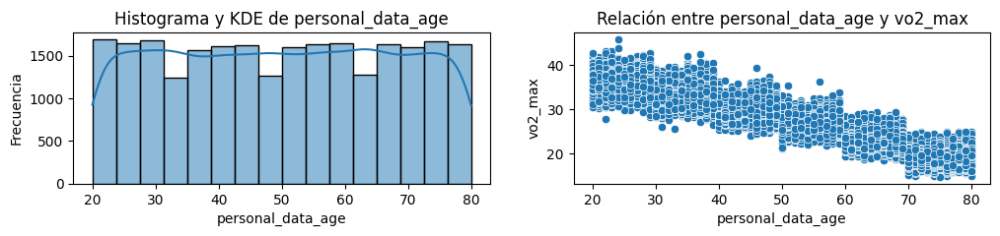

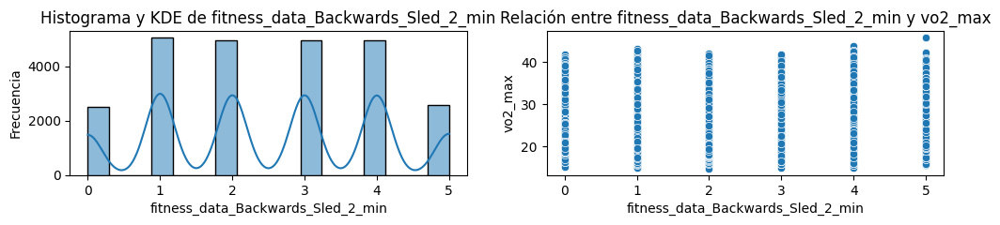

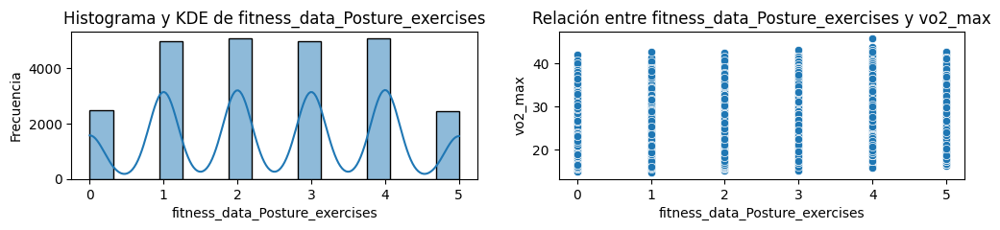

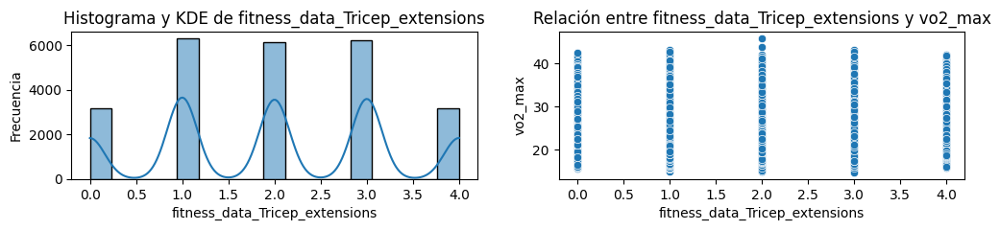

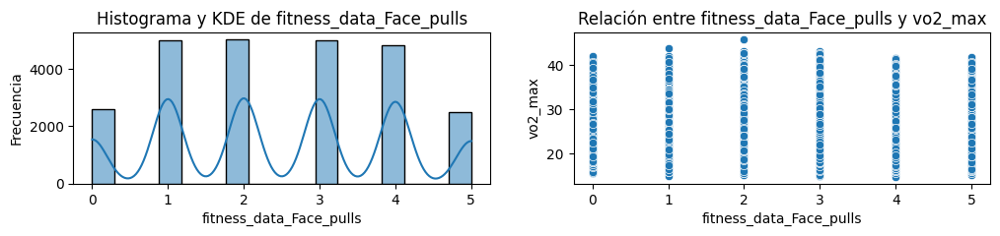

...

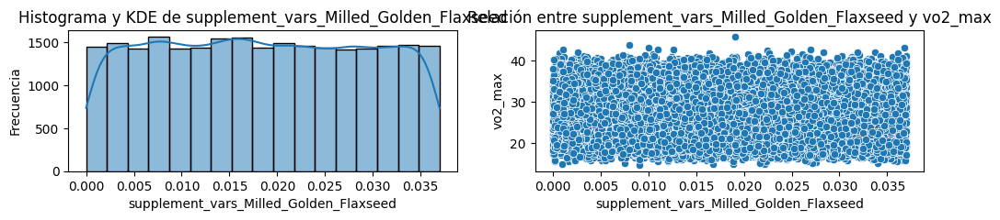

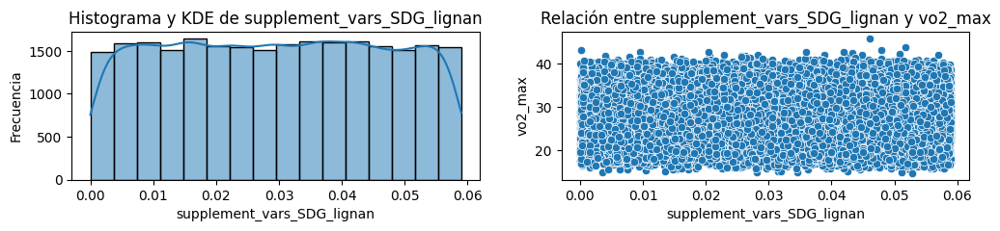

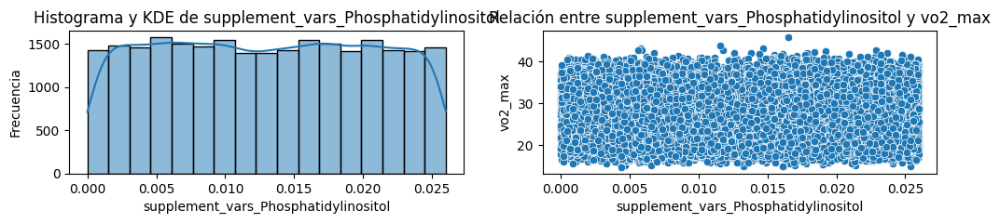

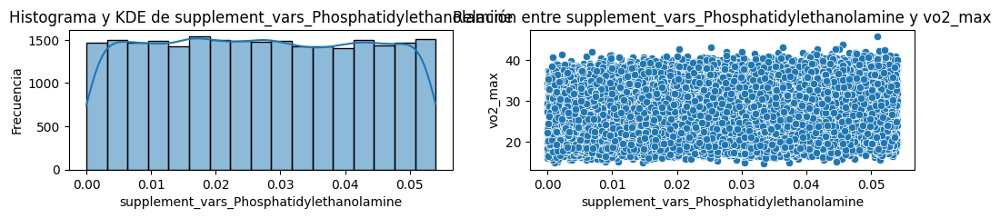

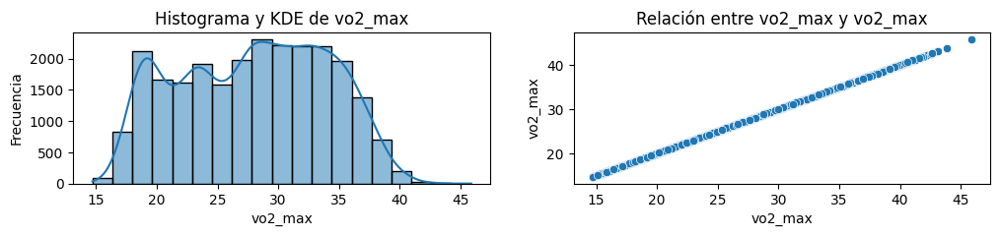

In [108]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import normaltest

# Suponemos que `df` es tu DataFrame

# Diccionario para almacenar los resultados de la prueba de normalidad
normality_results = {}

# Iterar sobre todas las columnas numéricas del DataFrame
for column in df_health.drop(columns=['y']).select_dtypes(include=[np.number]).columns:
    # Aplicar la prueba de D'Agostino's K^2
    stat, p_value = normaltest(df_health[column].dropna())  # Usar dropna() para asegurarse de que no hay NaNs
    normality_results[column] = {'Statistic': stat, 'p-value': p_value}

    # Gráfico para visualizar la distribución
    # Crear una figura con dos subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 2))

    # Primer subplot para la distribución
    sns.histplot(df_health[column], kde=True, bins='doane', ax=ax1)
    ax1.set_title(f'Histograma y KDE de {column}')
    ax1.set_ylabel('Frecuencia')
    ax1.set_xlabel(column)

    # Segundo subplot para el scatter plot
    sns.scatterplot(x=column, y='vo2_max', data=df_health, ax=ax2)
    ax2.set_title(f'Relación entre {column} y vo2_max')
    ax2.set_ylabel('vo2_max')
    ax2.set_xlabel(column)

    plt.show()



## 2.2 Calculo de metrica estadistica para evaluar la normalidad de las columnas

In [109]:
normality_results_df = pd.DataFrame(normality_results).T
normality_results_df.sort_values('Statistic').head(10)

,Statistic,p-value
fitness_data_StretchesCouch_Couch_,4468.847523,0.0
fitness_data_Back_extensions_on_a_hyperextension,5356.612410,0.0
fitness_data_10_min_HIIT,5447.437084,0.0
fitness_data_Chin_ups,5468.956995,0.0
fitness_data_Obliques_each_side_on_a_hyperextension,5487.607348,0.0
fitness_data_Reverse_Nordics,5504.967732,0.0
fitness_data_Pull_ups,5595.020799,0.0
fitness_data_Poliquin_step_ups,5733.790371,0.0
fitness_data_Seated_calf_raises,5778.729905,0.0
fitness_data_Tricep_extensions,6171.723083,0.0


In [110]:
normality_results_df.sort_values('Statistic').tail(10)

,Statistic,p-value
supplement_vars_Vitamin_E_d_alpha_tocopherol,23812.368669,0.0
supplement_vars_Cocoa_Powder_Non_Alkalised_8_Flavanols,23871.486386,0.0
supplement_vars_Vitamin_B1_Thiamine_HCl,24034.395955,0.0
supplement_vars_Calcium,24079.005429,0.0
supplement_vars_Garlic_extract_121_odorless,24273.932210,0.0
supplement_vars_Ginger,24298.236442,0.0
supplement_vars_Selenium,24702.133197,0.0
supplement_vars_Caffeine,24727.535744,0.0
supplement_vars_Nicotinamide_Riboside_Chloride_NR,25157.001087,0.0
supplement_vars_Fisetin_smoketree_extract,25514.852080,0.0


## 2.3 Calculo de correlacion de Pearson de las columnas numericas

In [111]:
# form correlation matrix
matrix = df_health[continuous_columns].corr()

In [112]:
# Pares de variables continuas con el mayor valor de correlacion encontrada para valores positivos

sub_matrix = matrix[(matrix > 0.05) & (matrix < 1)]
matrix_stacked = sub_matrix.stack().reset_index()
matrix_stacked.dropna(axis=0, how='all', inplace=True)
matrix_stacked.head(20)

,level_0,level_1,0
0,fitness_data_Posture_exercises,vo2_max,0.064851
1,fitness_data_Back_extensions_on_a_hyperextension,vo2_max,0.054359
2,fitness_data_Obliques_each_side_on_a_hyperexte...,vo2_max,0.055757
3,fitness_data_Slant_board_squats,vo2_max,0.058516
4,fitness_data_ATG_Split_squats,vo2_max,0.050672
5,fitness_data_Tibialis_raises,vo2_max,0.067199
6,supplement_vars_Nicotinamide_Riboside_Chloride_NR,vo2_max,0.059330
7,supplement_vars_Boron_Glycinate,vo2_max,0.054112
8,supplement_vars_Grape_Seed_Extract_90_polyphenols,vo2_max,0.067403
9,supplement_vars_Rhodiola_3_Rosavins__Salidrosi...,vo2_max,0.062362


In [113]:
# Pares de variables continuas con el mayor valor de correlacion encontrada para valores negativos

sub_matrix = matrix[(matrix < -0.05) & (matrix > -1)]
matrix_stacked = sub_matrix.stack().reset_index()
matrix_stacked.dropna(axis=0, how='all', inplace=True)
matrix_stacked

,level_0,level_1,0
0,personal_data_age,vo2_max,-0.94355
1,vo2_max,personal_data_age,-0.94355


# 3. Experimentacion y propuesta de modelos

## 3.1 Modelo de regresion lineal con todas las columnas

In [114]:
import statsmodels.formula.api as smf

try:
    continuous_columns.remove('vo2_max')
except:
    print('vo2_max no está en la lista de columnas continuas')

continuous_columns_integrated = ' + '.join(continuous_columns)

# Crear el modelo OLS (Ordinary Least Squares)
model = smf.ols(f'vo2_max ~ {continuous_columns_integrated} + C(personal_data_gender, Treatment)', data=df_health)

# Ajustar el modelo
results = model.fit()

# Mostrar el resumen del modelo
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                vo2_max   R-squared:                       0.961
Model:                            OLS   Adj. R-squared:                  0.960
Method:                 Least Squares   F-statistic:                     6064.
Date:                Mon, 20 May 2024   Prob (F-statistic):               0.00
Time:                        15:17:02   Log-Likelihood:                -40194.
No. Observations:               25000   AIC:                         8.059e+04
Df Residuals:                   24899   BIC:                         8.141e+04
Df Model:                         100                                         
Covariance Type:            nonrobust                                         
                                                                      coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------

## 3.2 Modelo de regresion lineal con todas las columnas y escaladas

In [115]:
import statsmodels.formula.api as smf

continuous_columns_integrated = ' + '.join([f'scale({element})' for element in continuous_columns])

# Crear el modelo OLS (Ordinary Least Squares)
model = smf.ols(f'vo2_max ~ {continuous_columns_integrated} + C(personal_data_gender, Treatment)', data=df_health)

# Ajustar el modelo
results = model.fit()

# Mostrar el resumen del modelo
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                vo2_max   R-squared:                       0.961
Model:                            OLS   Adj. R-squared:                  0.960
Method:                 Least Squares   F-statistic:                     6064.
Date:                Mon, 20 May 2024   Prob (F-statistic):               0.00
Time:                        15:17:09   Log-Likelihood:                -40194.
No. Observations:               25000   AIC:                         8.059e+04
Df Residuals:                   24899   BIC:                         8.141e+04
Df Model:                         100                                         
Covariance Type:            nonrobust                                         
                                                                             coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------

## 3.3 Modelo de regresion lineal con las columnas filtradas descartando las mayores a un p_value = 0.01

In [116]:
import statsmodels.formula.api as smf

th_p = 0.01
continuous_columns_integrated = ' + '.join(continuous_columns)

# Crear el modelo OLS (Ordinary Least Squares)
model = smf.ols(f'vo2_max ~ {continuous_columns_integrated} + C(personal_data_gender, Treatment)', data=df_health)

# Ajustar el modelo
results = model.fit()

# -----------------------------------------------------

significant_columns = np.intersect1d(results.pvalues[results.pvalues<th_p].index.to_list(), continuous_columns) 
significant_columns_integrated = ' + '.join(significant_columns)

# Crear el modelo OLS (Ordinary Least Squares)
model = smf.ols(f'vo2_max ~ {significant_columns_integrated} + C(personal_data_gender, Treatment)', data=df_health)

# Ajustar el modelo
results = model.fit()

# Mostrar el resumen del modelo
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                vo2_max   R-squared:                       0.960
Model:                            OLS   Adj. R-squared:                  0.960
Method:                 Least Squares   F-statistic:                 2.334e+04
Date:                Mon, 20 May 2024   Prob (F-statistic):               0.00
Time:                        15:17:09   Log-Likelihood:                -40224.
No. Observations:               25000   AIC:                         8.050e+04
Df Residuals:                   24973   BIC:                         8.072e+04
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
                                                          coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------

## 3.4 Modelo de regresion lineal con las columnas filtradas descartando las mayores a un p_value = 0.01 y escaladas

In [117]:
import statsmodels.formula.api as smf

th_p = 0.01
continuous_columns_integrated = ' + '.join([f'scale({element})' for element in continuous_columns])


# Crear el modelo OLS (Ordinary Least Squares)
model = smf.ols(f'vo2_max ~ {continuous_columns_integrated} + C(personal_data_gender, Treatment)', data=df_health)

# Ajustar el modelo
results = model.fit()

# -----------------------------------------------------

significant_columns = np.intersect1d(results.pvalues[results.pvalues<th_p].index.to_list(), [f'scale({element})' for element in continuous_columns]) 
significant_columns_integrated = ' + '.join(significant_columns)


# Crear el modelo OLS (Ordinary Least Squares)
model = smf.ols(f'vo2_max ~ {significant_columns_integrated} + C(personal_data_gender, Treatment)', data=df_health)

# Ajustar el modelo
results = model.fit()

# Mostrar el resumen del modelo
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                vo2_max   R-squared:                       0.960
Model:                            OLS   Adj. R-squared:                  0.960
Method:                 Least Squares   F-statistic:                 2.334e+04
Date:                Mon, 20 May 2024   Prob (F-statistic):               0.00
Time:                        15:17:18   Log-Likelihood:                -40224.
No. Observations:               25000   AIC:                         8.050e+04
Df Residuals:                   24973   BIC:                         8.072e+04
Df Model:                          26                                         
Covariance Type:            nonrobust                                         
                                                                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------

## 3.5 Modelo de regresion lineal para Hombres con las columnas filtradas descartando las mayores a un p_value = 0.01

In [118]:
import statsmodels.formula.api as smf
import numpy as np

th_p = 0.01
continuous_columns_integrated = ' + '.join(continuous_columns)

# Crear el modelo OLS (Ordinary Least Squares)
model = smf.ols(f'vo2_max ~ {continuous_columns_integrated}', data=df_health_men)

# Ajustar el modelo
results = model.fit()

# -----------------------------------------------------

significant_columns = np.intersect1d(results.pvalues[results.pvalues<th_p].index.to_list(), continuous_columns) 
significant_columns_integrated = ' + '.join(significant_columns)

# Crear el modelo OLS (Ordinary Least Squares)
model = smf.ols(f'vo2_max ~ {significant_columns_integrated}', data=df_health_men)

# Ajustar el modelo
results = model.fit()

# Mostrar el resumen del modelo
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                vo2_max   R-squared:                       0.960
Model:                            OLS   Adj. R-squared:                  0.960
Method:                 Least Squares   F-statistic:                 1.320e+04
Date:                Mon, 20 May 2024   Prob (F-statistic):               0.00
Time:                        15:17:18   Log-Likelihood:                -20159.
No. Observations:               12556   AIC:                         4.037e+04
Df Residuals:                   12532   BIC:                         4.054e+04
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
                                                          coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------

In [119]:
from sklearn.metrics import r2_score
import statsmodels.api as sm

df_health_test_men_const = sm.add_constant(df_health_test_men[np.intersect1d(df_health_test_men.columns.to_list(), significant_columns)])

y_pred = results.predict(df_health_test_men_const)
y_gt = df_health_test_men['vo2_max']

# Calcular R^2 usando y (valores reales) y y_pred (valores predichos)
r_squared = r2_score(y_gt, y_pred)
print("R-squared:", r_squared)

R-squared: 0.9601813111624226


## 3.6 Modelo de regresion lineal para Hombres con las columnas filtradas descartando las mayores a un p_value = 0.01 y escaladas

In [120]:
import statsmodels.formula.api as smf

th_p = 0.01
continuous_columns_integrated = ' + '.join([f'scale({element})' for element in continuous_columns])


# Crear el modelo OLS (Ordinary Least Squares)
model = smf.ols(f'vo2_max ~ {continuous_columns_integrated} + C(personal_data_gender, Treatment)', data=df_health_men)

# Ajustar el modelo
results = model.fit()

# -----------------------------------------------------

significant_columns = np.intersect1d(results.pvalues[results.pvalues<th_p].index.to_list(), [f'scale({element})' for element in continuous_columns]) 
significant_columns_integrated = ' + '.join(significant_columns)


# Crear el modelo OLS (Ordinary Least Squares)
model = smf.ols(f'vo2_max ~ {significant_columns_integrated} + C(personal_data_gender, Treatment)', data=df_health_men)

# Ajustar el modelo
results = model.fit()

# Mostrar el resumen del modelo
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                vo2_max   R-squared:                       0.960
Model:                            OLS   Adj. R-squared:                  0.960
Method:                 Least Squares   F-statistic:                 1.320e+04
Date:                Mon, 20 May 2024   Prob (F-statistic):               0.00
Time:                        15:17:22   Log-Likelihood:                -20159.
No. Observations:               12556   AIC:                         4.037e+04
Df Residuals:                   12532   BIC:                         4.054e+04
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
                                                                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------

## 3.7 Modelo de regresion lineal para Mujeres con las columnas filtradas descartando las mayores a un p_value = 0.01

In [121]:
import statsmodels.formula.api as smf
import numpy as np

th_p = 0.01
continuous_columns_integrated = ' + '.join(continuous_columns)

# Crear el modelo OLS (Ordinary Least Squares)
model = smf.ols(f'vo2_max ~ {continuous_columns_integrated}', data=df_health_women)

# Ajustar el modelo
results = model.fit()

# -----------------------------------------------------

significant_columns = np.intersect1d(results.pvalues[results.pvalues<th_p].index.to_list(), continuous_columns) 
significant_columns_integrated = ' + '.join(significant_columns)

# Crear el modelo OLS (Ordinary Least Squares)
model = smf.ols(f'vo2_max ~ {significant_columns_integrated}', data=df_health_women)

# Ajustar el modelo
results = model.fit()

# Mostrar el resumen del modelo
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                vo2_max   R-squared:                       0.961
Model:                            OLS   Adj. R-squared:                  0.961
Method:                 Least Squares   F-statistic:                 1.376e+04
Date:                Mon, 20 May 2024   Prob (F-statistic):               0.00
Time:                        15:17:23   Log-Likelihood:                -20063.
No. Observations:               12444   AIC:                         4.017e+04
Df Residuals:                   12421   BIC:                         4.034e+04
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
                                                          coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------

In [122]:
from sklearn.metrics import r2_score
import statsmodels.api as sm

df_health_test_women_const = sm.add_constant(df_health_test_women[np.intersect1d(df_health_test_women.columns.to_list(), significant_columns)])

y_pred = results.predict(df_health_test_women_const)
y_gt = df_health_test_women['vo2_max']

# Calcular R^2 usando y (valores reales) y y_pred (valores predichos)
r_squared = r2_score(y_gt, y_pred)
print("R-squared:", r_squared)

R-squared: 0.9596386337876618


## 3.8 Modelo de regresion lineal para Mujeres con las columnas filtradas descartando las mayores a un p_value = 0.01 y escaladas

In [123]:
import statsmodels.formula.api as smf

th_p = 0.01
continuous_columns_integrated = ' + '.join([f'scale({element})' for element in continuous_columns])


# Crear el modelo OLS (Ordinary Least Squares)
model = smf.ols(f'vo2_max ~ {continuous_columns_integrated} + C(personal_data_gender, Treatment)', data=df_health_women)

# Ajustar el modelo
results = model.fit()

# -----------------------------------------------------

significant_columns = np.intersect1d(results.pvalues[results.pvalues<th_p].index.to_list(), [f'scale({element})' for element in continuous_columns]) 
significant_columns_integrated = ' + '.join(significant_columns)


# Crear el modelo OLS (Ordinary Least Squares)
model = smf.ols(f'vo2_max ~ {significant_columns_integrated} + C(personal_data_gender, Treatment)', data=df_health_women)

# Ajustar el modelo
results = model.fit()

# Mostrar el resumen del modelo
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                vo2_max   R-squared:                       0.961
Model:                            OLS   Adj. R-squared:                  0.961
Method:                 Least Squares   F-statistic:                 1.376e+04
Date:                Mon, 20 May 2024   Prob (F-statistic):               0.00
Time:                        15:17:27   Log-Likelihood:                -20063.
No. Observations:               12444   AIC:                         4.017e+04
Df Residuals:                   12421   BIC:                         4.034e+04
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
                                                                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------

## 3.9 Modelo de regresion lineal multiclase

In [125]:
from sklearn.linear_model import LogisticRegression

clf = LogisticRegression(random_state=0).fit(df_health.drop(columns=['y', 'vo2_max', 'personal_data_gender', 'personal_data_name']), df_health['y'])

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [152]:
from sklearn.metrics import accuracy_score, classification_report

# Predecir en el conjunto de prueba
y_pred = clf.predict(df_health[continuous_columns])

# Evaluar la precisión
accuracy = accuracy_score(df_health['y'], y_pred)
print("Accuracy:", accuracy)

# Mostrar el informe de clasificación
print(classification_report(df_health['y'], y_pred))

Accuracy: 0.81684
              precision    recall  f1-score   support

           0       0.50      0.05      0.10        37
           1       0.82      0.99      0.90     20415
           2       0.51      0.04      0.08      4537
           3       0.00      0.00      0.00        11

    accuracy                           0.82     25000
   macro avg       0.46      0.27      0.27     25000
weighted avg       0.76      0.82      0.75     25000



/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()

## 3.10 Modelo de Boosting de arboles de decision multiclase

In [148]:
import xgboost as xgb

# Configurar el modelo
model = xgb.XGBClassifier(objective='multi:softprob', num_class=4, random_state=42)

# Entrenar el modelo
model.fit(df_health[continuous_columns], df_health['y'])

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None, num_class=4,
              num_parallel_tree=None, ...)

In [149]:
from sklearn.metrics import accuracy_score, classification_report

# Predecir en el conjunto de prueba
y_pred = model.predict(df_health[continuous_columns])

# Evaluar la precisión
accuracy = accuracy_score(df_health['y'], y_pred)
print("Accuracy:", accuracy)

# Mostrar el informe de clasificación
print(classification_report(df_health['y'], y_pred))

Accuracy: 0.9938
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        37
           1       0.99      1.00      1.00     20415
           2       0.99      0.97      0.98      4537
           3       1.00      1.00      1.00        11

    accuracy                           0.99     25000
   macro avg       1.00      0.99      0.99     25000
weighted avg       0.99      0.99      0.99     25000



## 3.11 Calculo de importancia de columnas segun el modelo de Boosting de arboles de decision multiclase

In [129]:
# Obtener la importancia de las características
feature_importances = model.feature_importances_

# Crear un DataFrame para visualizar mejor las importancias
feature_importance_df = pd.DataFrame({
    'Feature': df_health[continuous_columns].columns,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=False)

feature_importance_df.head(15)

,Feature,Importance
0,personal_data_age,0.041361
16,fitness_data_ATG_Split_squats,0.023671
7,fitness_data_Back_extensions_on_a_hyperextension,0.021933
2,fitness_data_Posture_exercises,0.021204
15,fitness_data_Slant_board_squats,0.019690
19,fitness_data_Tibialis_raises,0.019689
8,fitness_data_Obliques_each_side_on_a_hyperexte...,0.019074
67,supplement_vars_Vitamin_K2_MK_4_MCT_Oil,0.017903
69,supplement_vars_Phosphatidylcholine,0.017447
39,supplement_vars_Grape_Seed_Extract_90_polyphenols,0.017363


# 4. Analisis de modelos elegidos

## 4.1 Modelo de regresion lineal para Hombres

In [130]:
# Modelo final Hombres
import statsmodels.formula.api as smf
import numpy as np

th_p = 0.01
continuous_columns_integrated = ' + '.join(continuous_columns)

# Crear el modelo OLS (Ordinary Least Squares)
model = smf.ols(f'vo2_max ~ {continuous_columns_integrated}', data=df_health_men)

# Ajustar el modelo
results = model.fit()

# -----------------------------------------------------

significant_columns_m = np.intersect1d(results.pvalues[results.pvalues<th_p].index.to_list(), continuous_columns) 
significant_columns_m_integrated = ' + '.join(significant_columns_m)

# Crear el modelo OLS (Ordinary Least Squares)
final_model_m = smf.ols(f'vo2_max ~ {significant_columns_m_integrated}', data=df_health_men).fit()

# Mostrar el resumen del modelo
print(final_model_m.summary())

                            OLS Regression Results                            
Dep. Variable:                vo2_max   R-squared:                       0.960
Model:                            OLS   Adj. R-squared:                  0.960
Method:                 Least Squares   F-statistic:                 1.320e+04
Date:                Mon, 20 May 2024   Prob (F-statistic):               0.00
Time:                        15:18:35   Log-Likelihood:                -20159.
No. Observations:               12556   AIC:                         4.037e+04
Df Residuals:                   12532   BIC:                         4.054e+04
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
                                                          coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------

In [131]:
from sklearn.metrics import r2_score
import statsmodels.api as sm

df_health_test_men_const = sm.add_constant(df_health_test_men[np.intersect1d(df_health_test_men.columns.to_list(), significant_columns_m)])

y_pred = final_model_m.predict(df_health_test_men_const)
y_gt = df_health_test_men['vo2_max']

# Calcular R^2 usando y (valores reales) y y_pred (valores predichos)
r_squared = r2_score(y_gt, y_pred)
print("R-squared:", r_squared)

R-squared: 0.9601813111624226


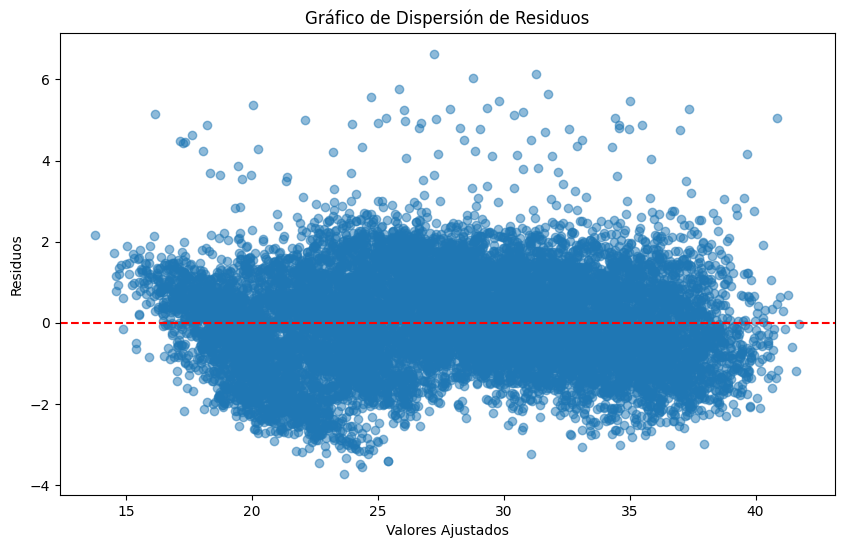

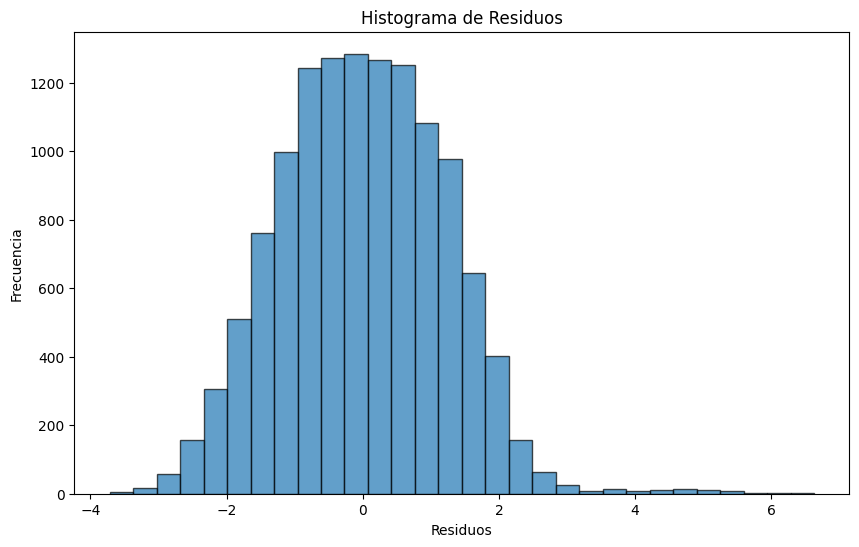

In [132]:
residuos = final_model_m.resid

# Calcular los valores ajustados
y_ajustados = final_model_m.fittedvalues

# Gráfico de dispersión de residuos
plt.figure(figsize=(10, 6))
plt.scatter(y_ajustados, residuos, alpha=0.5)
plt.axhline(0, color='red', linestyle='--')  # Línea en y=0 para referencia
plt.title('Gráfico de Dispersión de Residuos')
plt.xlabel('Valores Ajustados')
plt.ylabel('Residuos')
plt.show()

# Histograma de residuos
plt.figure(figsize=(10, 6))
plt.hist(residuos, bins=30, edgecolor='k', alpha=0.7)
plt.title('Histograma de Residuos')
plt.xlabel('Residuos')
plt.ylabel('Frecuencia')
plt.show()

## 4.2 Modelo de regresion lineal para Mujeres

In [133]:
# Modelo final Mujeres
import statsmodels.formula.api as smf
import numpy as np

th_p = 0.01
continuous_columns_integrated = ' + '.join(continuous_columns)

# Crear el modelo OLS (Ordinary Least Squares)
model = smf.ols(f'vo2_max ~ {continuous_columns_integrated}', data=df_health_women)

# Ajustar el modelo
results = model.fit()

# -----------------------------------------------------

significant_columns_f = np.intersect1d(results.pvalues[results.pvalues<th_p].index.to_list(), continuous_columns) 
significant_columns_f_integrated = ' + '.join(significant_columns_f)

# Crear el modelo OLS (Ordinary Least Squares)
final_model_f = smf.ols(f'vo2_max ~ {significant_columns_f_integrated}', data=df_health_women).fit()

# Mostrar el resumen del modelo
print(final_model_f.summary())

                            OLS Regression Results                            
Dep. Variable:                vo2_max   R-squared:                       0.961
Model:                            OLS   Adj. R-squared:                  0.961
Method:                 Least Squares   F-statistic:                 1.376e+04
Date:                Mon, 20 May 2024   Prob (F-statistic):               0.00
Time:                        15:18:38   Log-Likelihood:                -20063.
No. Observations:               12444   AIC:                         4.017e+04
Df Residuals:                   12421   BIC:                         4.034e+04
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
                                                          coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------

In [134]:
from sklearn.metrics import r2_score
import statsmodels.api as sm

df_health_test_women_const = sm.add_constant(df_health_test_women[np.intersect1d(df_health_test_women.columns.to_list(), significant_columns_f)])

y_pred = final_model_f.predict(df_health_test_women_const)
y_gt = df_health_test_women['vo2_max']

# Calcular R^2 usando y (valores reales) y y_pred (valores predichos)
r_squared = r2_score(y_gt, y_pred)
print("R-squared:", r_squared)

R-squared: 0.9596386337876618


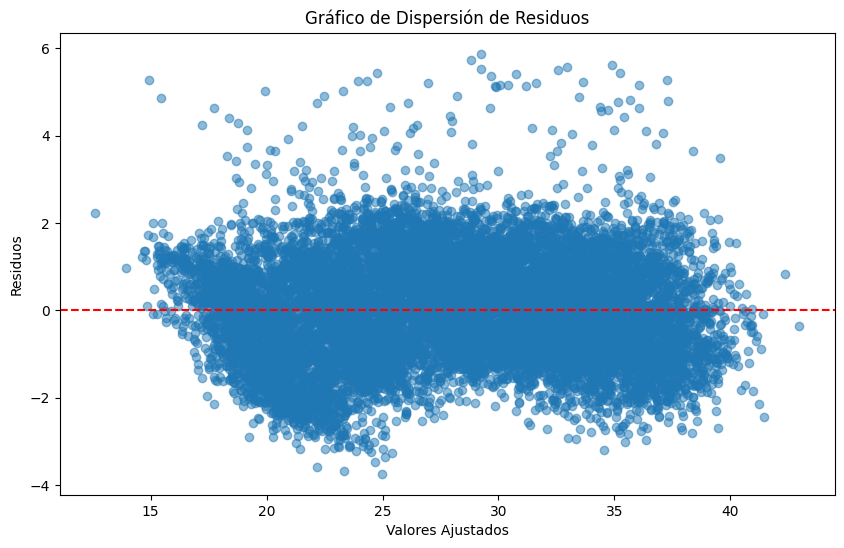

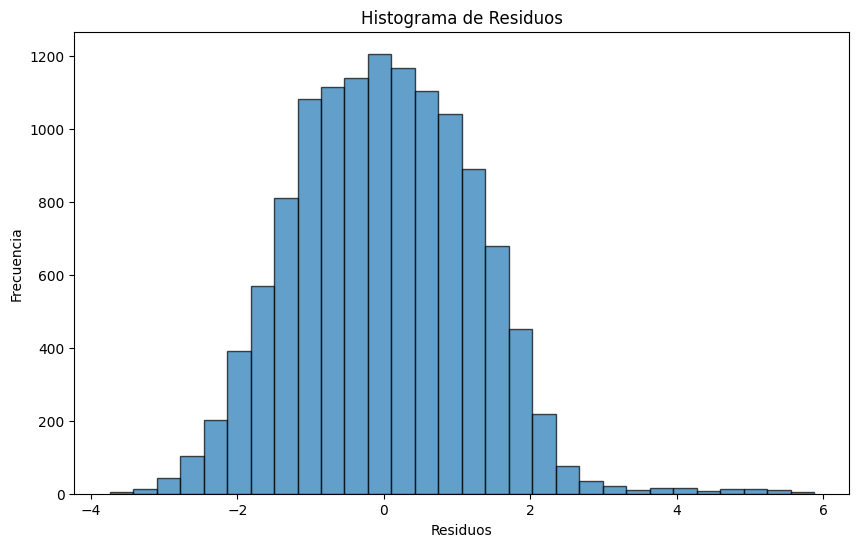

In [135]:
residuos = final_model_f.resid

# Calcular los valores ajustados
y_ajustados = final_model_f.fittedvalues

# Gráfico de dispersión de residuos
plt.figure(figsize=(10, 6))
plt.scatter(y_ajustados, residuos, alpha=0.5)
plt.axhline(0, color='red', linestyle='--')  # Línea en y=0 para referencia
plt.title('Gráfico de Dispersión de Residuos')
plt.xlabel('Valores Ajustados')
plt.ylabel('Residuos')
plt.show()

# Histograma de residuos
plt.figure(figsize=(10, 6))
plt.hist(residuos, bins=30, edgecolor='k', alpha=0.7)
plt.title('Histograma de Residuos')
plt.xlabel('Residuos')
plt.ylabel('Frecuencia')
plt.show()

## 4.3 Comportamiento de las variables predictoras en Hombres segun datos optimos

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


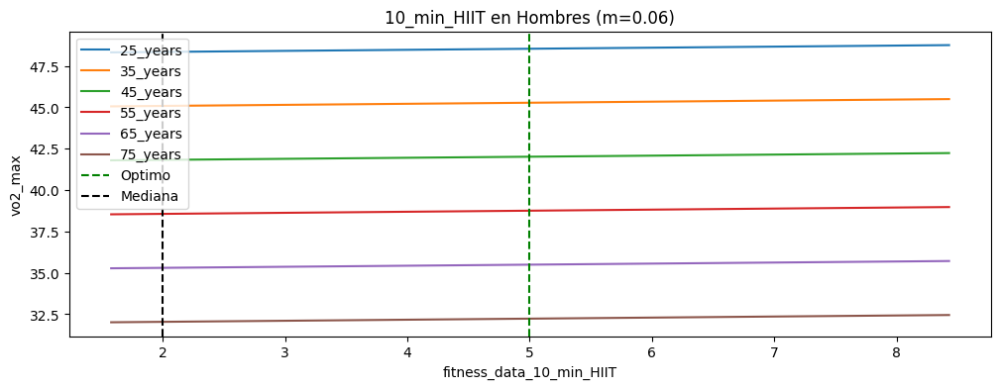

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


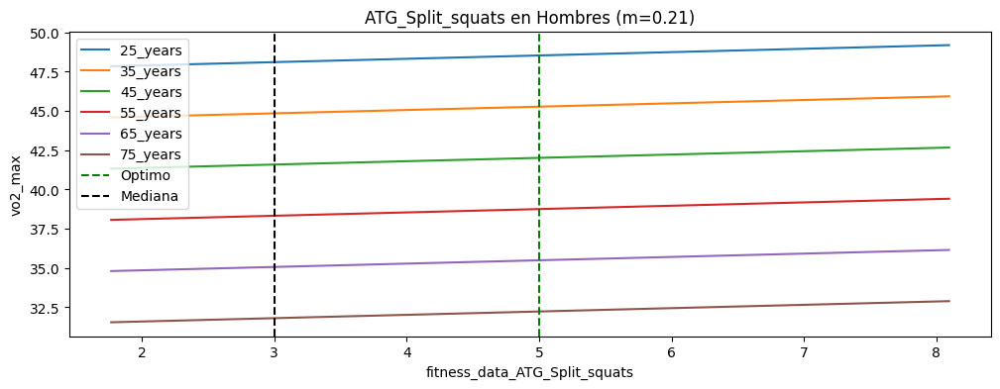

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


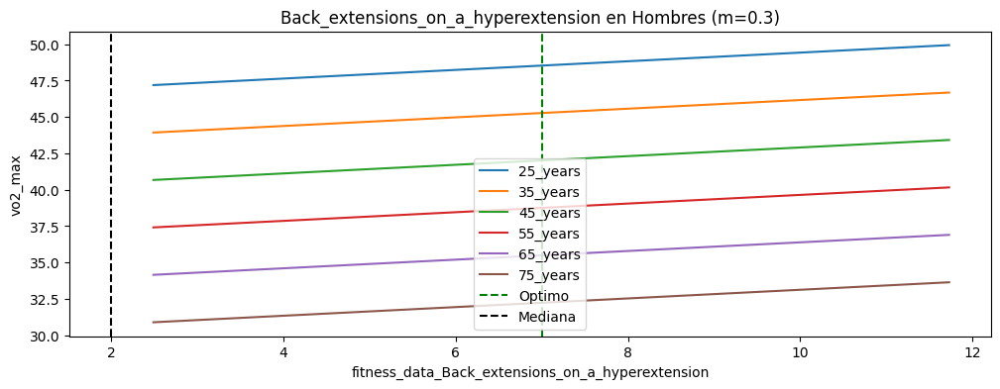

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


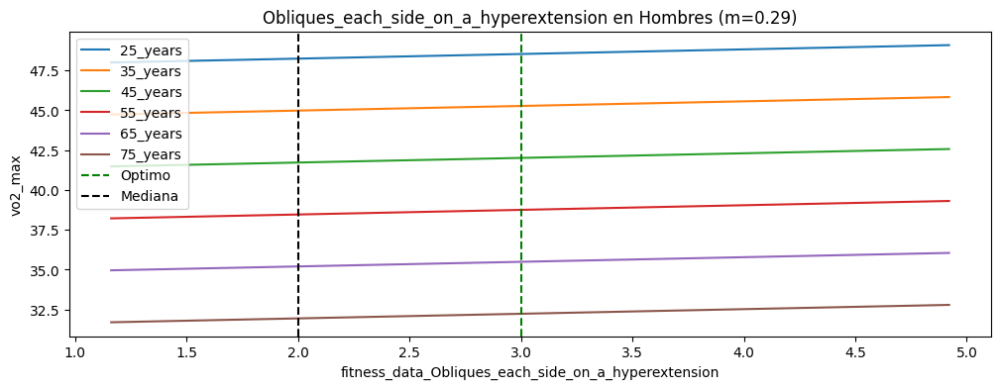

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


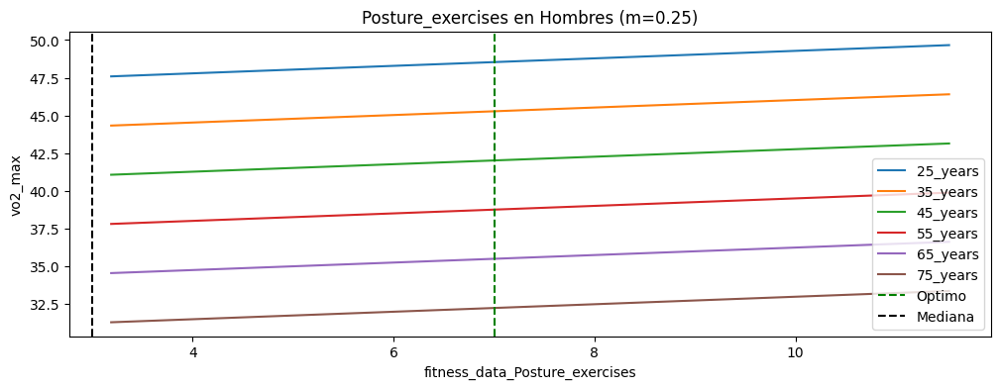

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


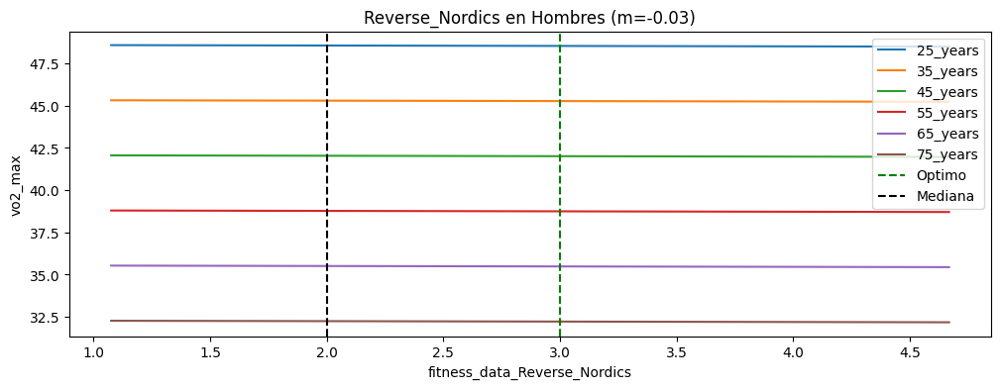

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


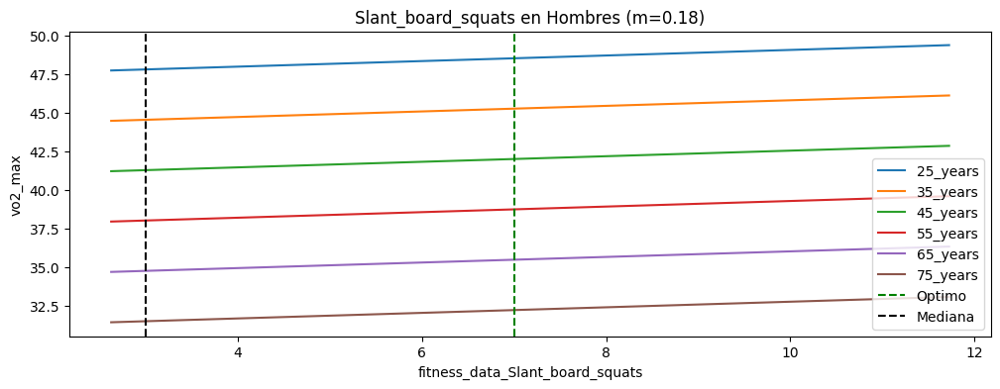

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


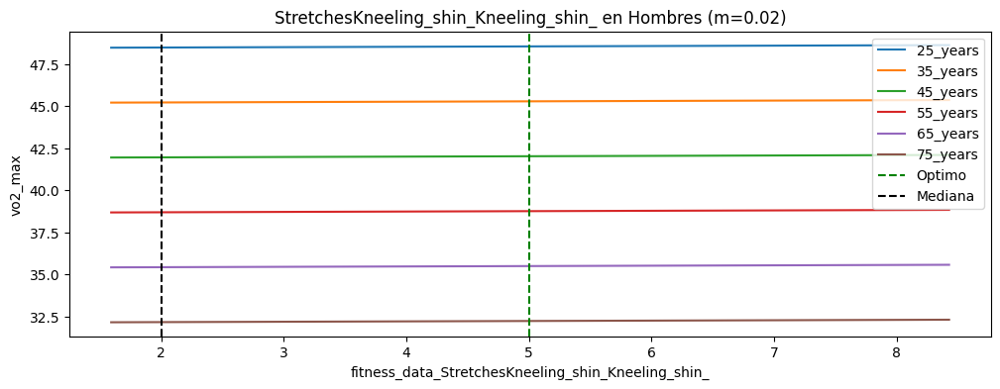

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


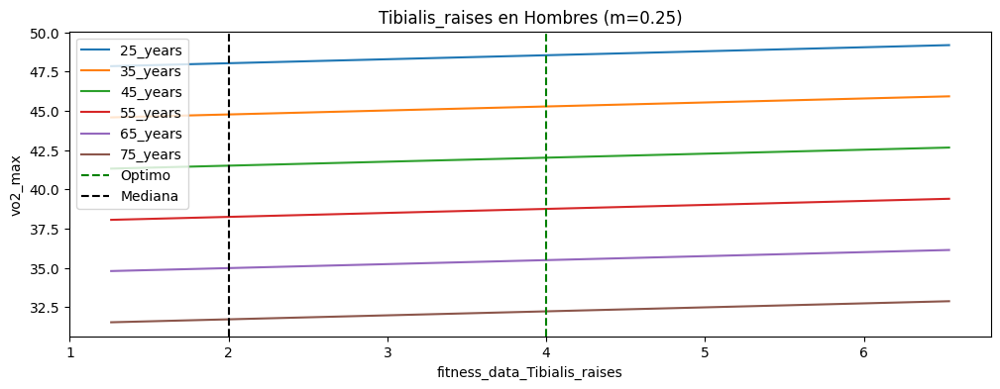

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


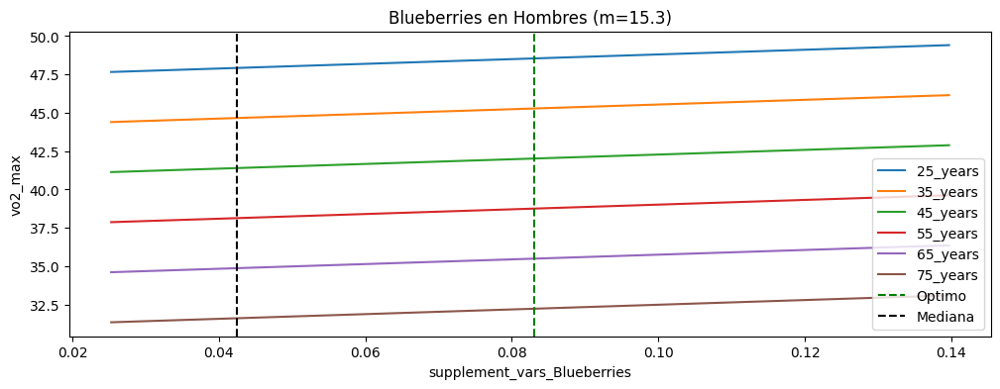

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


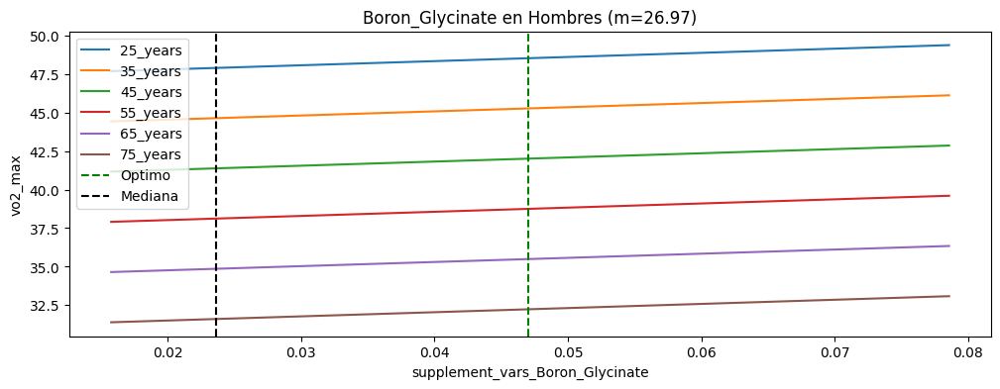

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


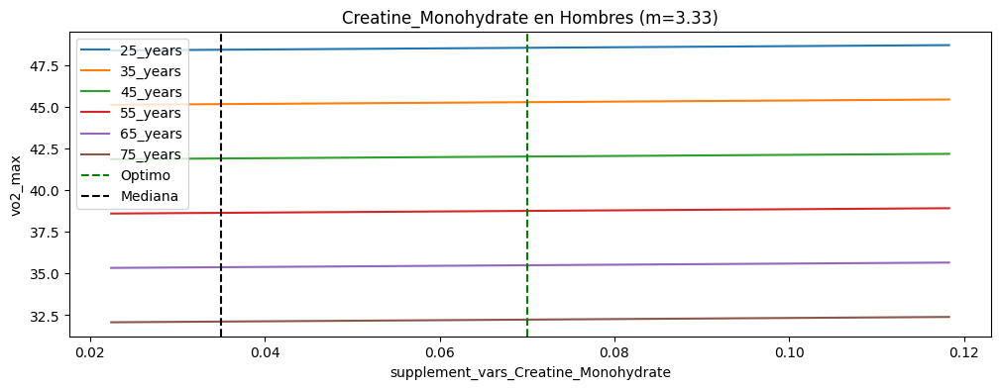

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


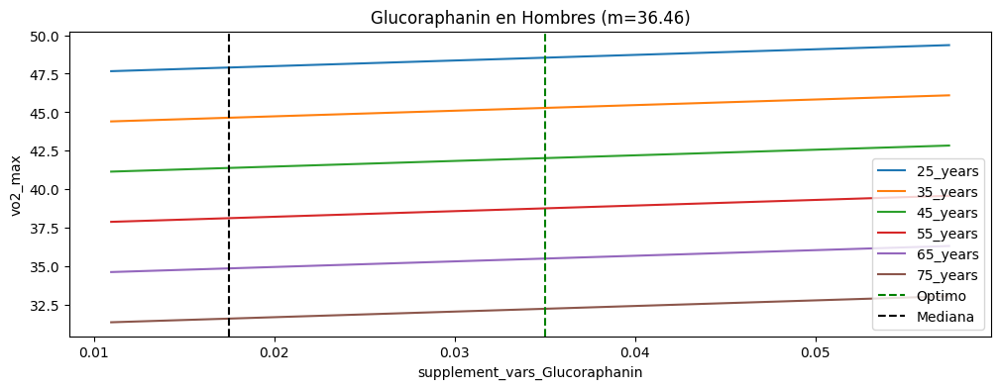

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


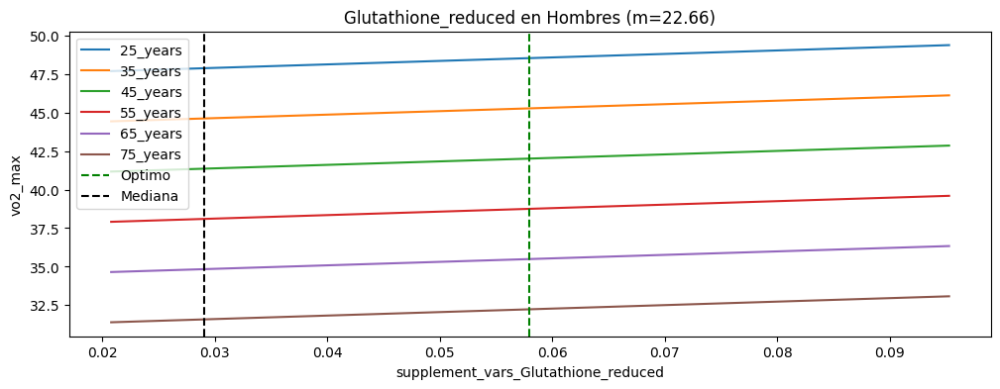

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


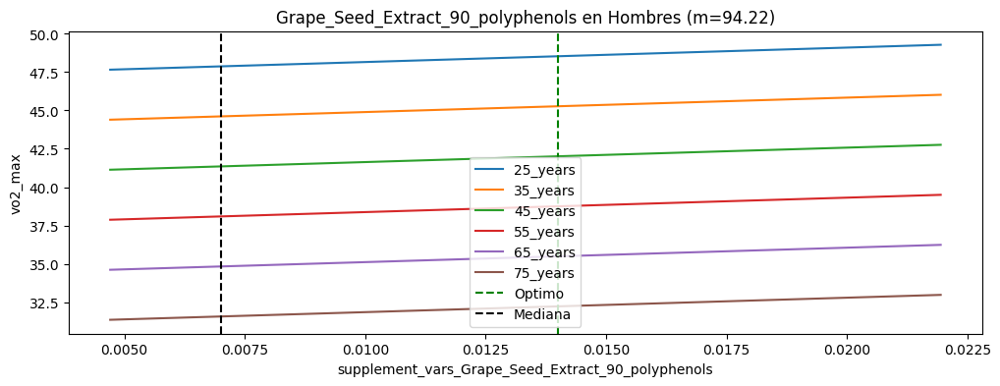

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


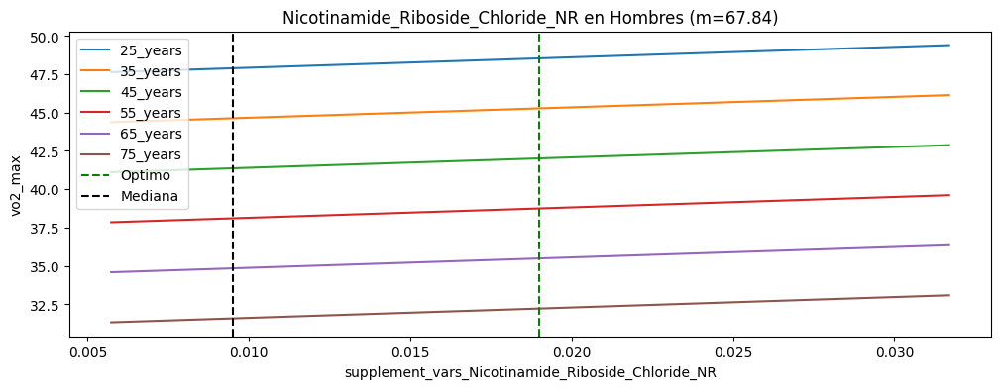

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


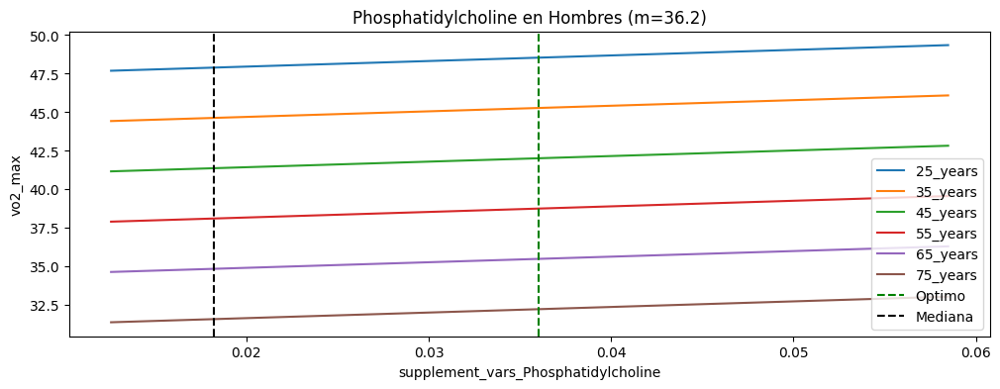

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


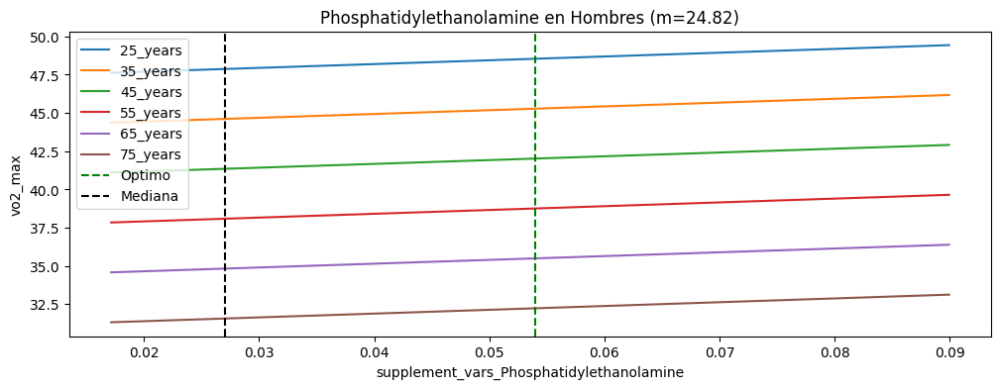

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


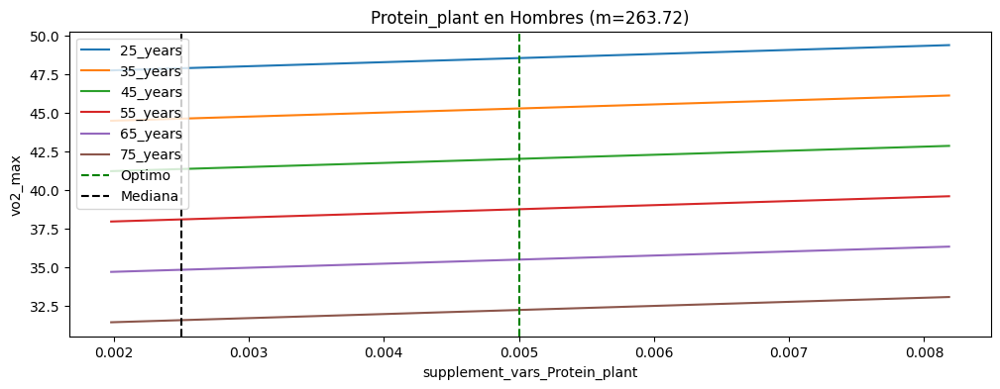

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


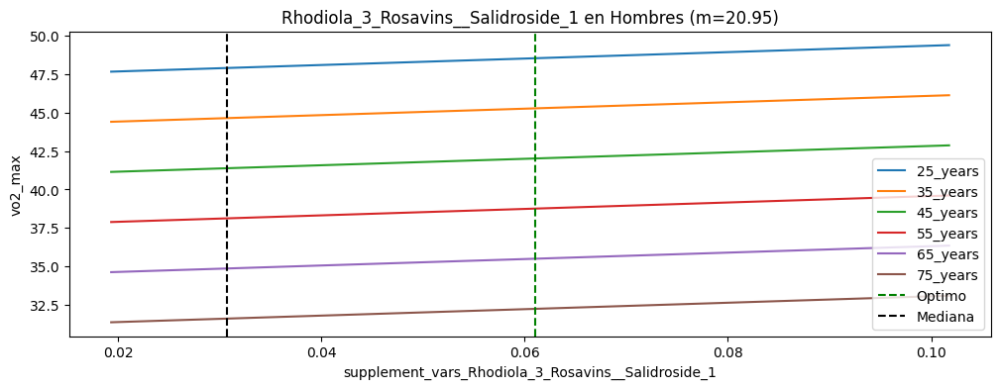

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


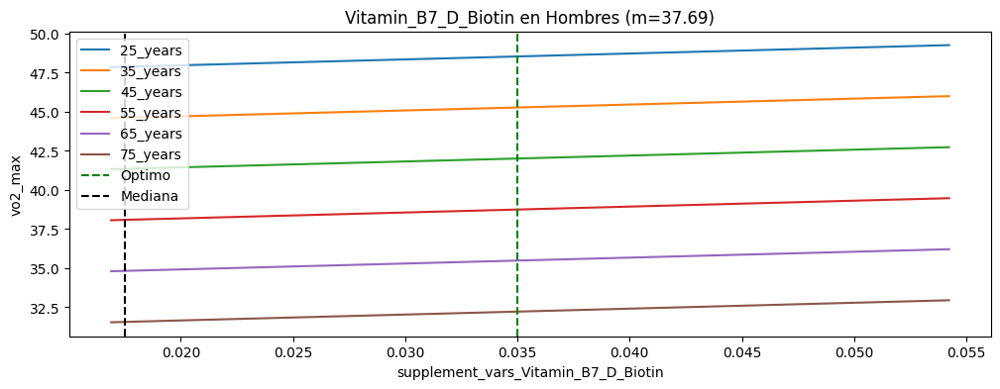

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


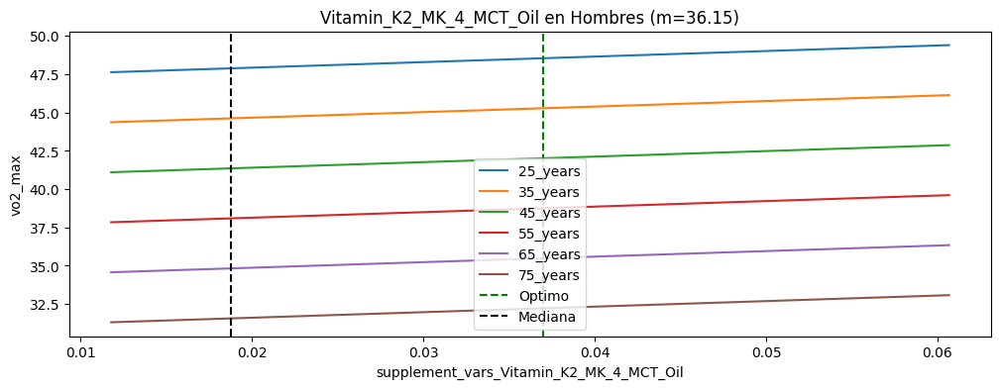

In [136]:
import matplotlib.pyplot as plt
import numpy as np

model_features_m = final_model_m.params.index.to_list()
model_features_m.remove('Intercept')
model_features_m.remove('personal_data_age')

for column_test in model_features_m:
    # Supongamos que este es el valor de la mediana de tu muestra
    mediana = df_health_optimal[column_test]  # Puedes ajustar esto según tu muestra real
    # Calcular el rango de valores
    limite_inferior = mediana * 0.3  # 70% menos de la mediana
    limite_superior = mediana * 1.7  # 70% más de la mediana
    # Generar 10 valores aleatorios entre el 30% menos de la mediana
    valores_inferiores = np.random.uniform(low=limite_inferior, high=mediana, size=10)
    # Generar 10 valores aleatorios entre el 30% más de la mediana
    valores_superiores = np.random.uniform(low=mediana, high=limite_superior, size=10)
    # Unir ambos arrays para tener los 20 valores
    valores_totales = np.sort(np.concatenate((valores_inferiores, mediana, valores_superiores)))

    ages_to_test_list = [25, 35, 45, 55, 65, 75]
    df_m_test_results = pd.DataFrame(data=valores_totales, columns=[column_test])

    for selected_age in ages_to_test_list:
        df_health_optimal['personal_data_age'] = selected_age

        df_test = pd.concat([df_health_optimal] * len(valores_totales), ignore_index=True)
        df_test[column_test] = valores_totales

        df_test_const = sm.add_constant(df_test)
        vo2_max_m_test = final_model_m.predict(df_test_const)

        df_m_test_results[f'{selected_age}_years'] = vo2_max_m_test

    
    # Gráfico para visualizar la distribución
    # Crear una figura con dos subplots
    fig, ax = plt.subplots(1, 1, figsize=(12, 4))
    pendiente_m = (final_model_m.predict(sm.add_constant(df_test).iloc[10]).values[0] - final_model_m.predict(sm.add_constant(df_test).iloc[9]).values[0]) / (valores_totales[10] - valores_totales[9])

    # Primer subplot para la distribución
    df_m_test_results.plot.line(x=column_test, ax=ax)
    # Añadir una línea de referencia vertical
    ax.axvline(x=[mediana], color='green', linestyle='--', label='Optimo')
    ax.axvline(x=df_health_men[column_test].median(), color='black', linestyle='--', label='Mediana')
    ax.set_title(f'{column_test.replace('fitness_data_', '').replace('supplement_vars_', '')} en Hombres (m={round(pendiente_m, 2)})')
    ax.set_ylabel('vo2_max')
    ax.set_xlabel(column_test)
    ax.legend()

    plt.show()
    

## 4.4 Comportamiento de las variables predictoras en Mujeres segun datos optimos

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


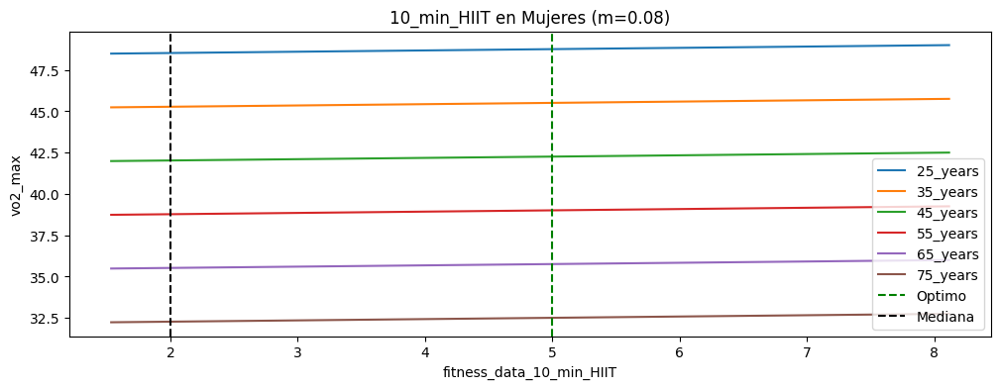

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


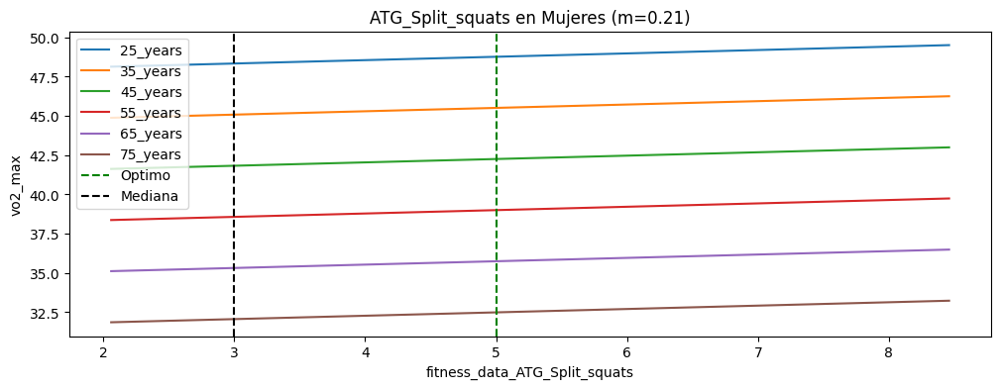

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


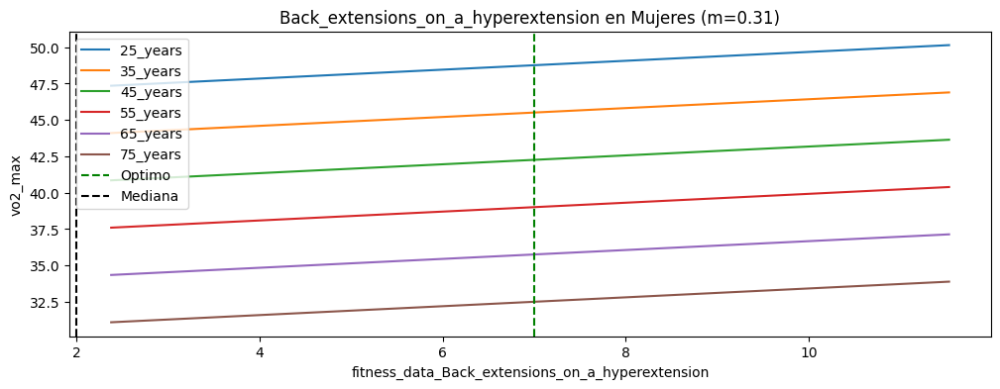

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


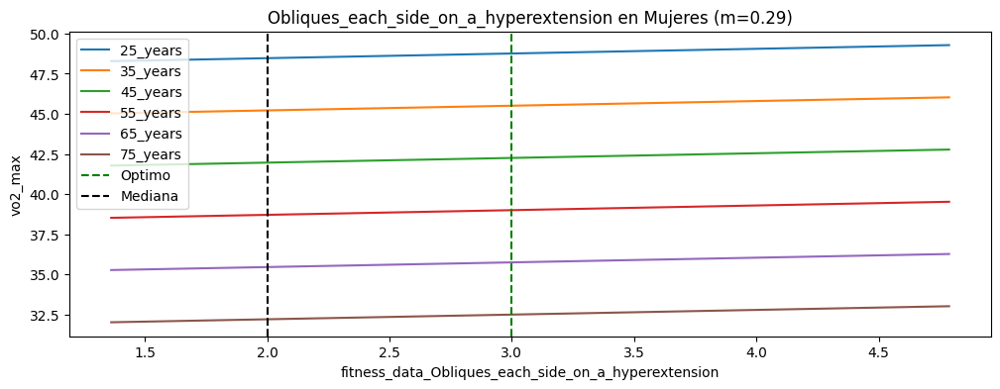

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


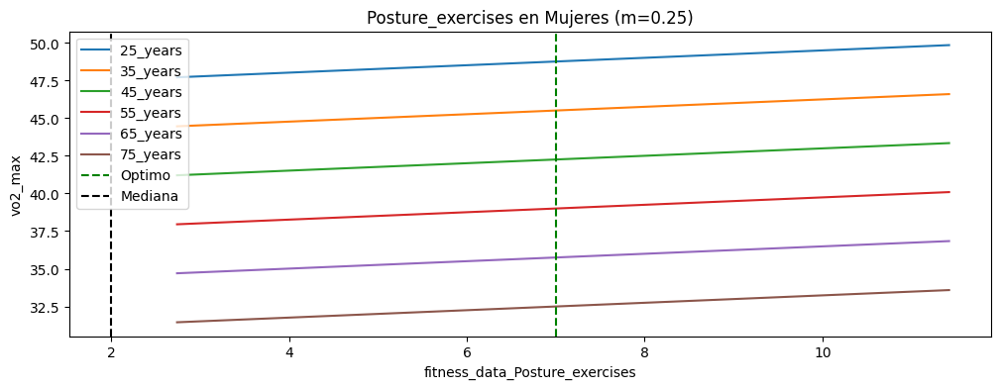

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


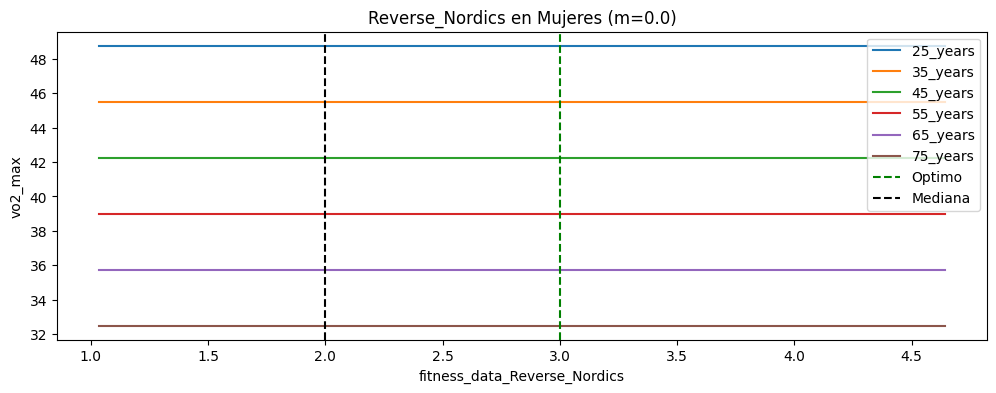

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


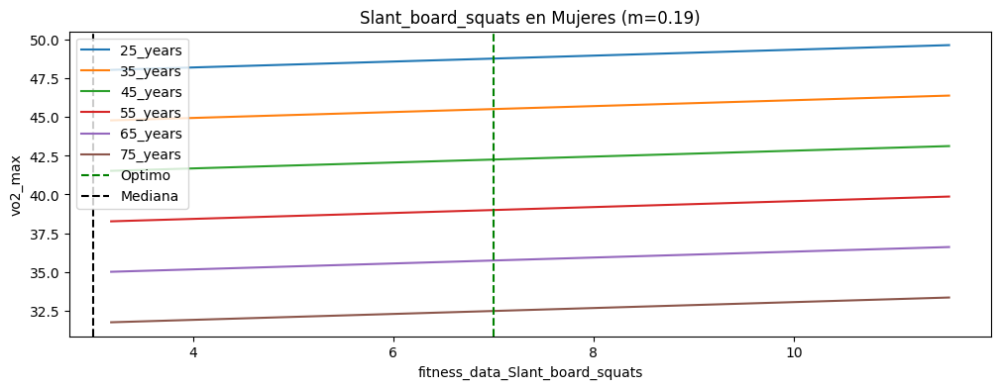

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


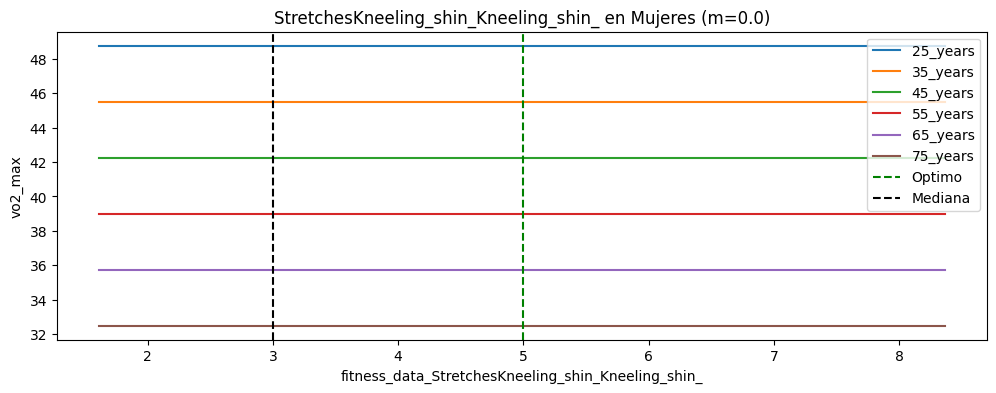

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


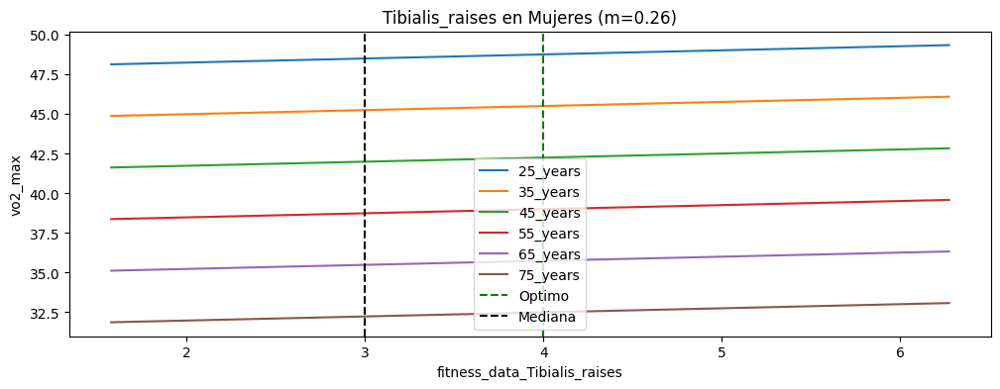

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


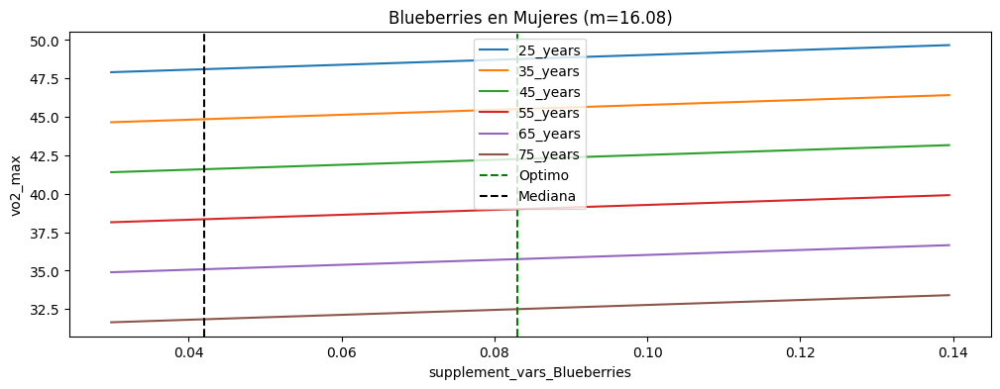

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


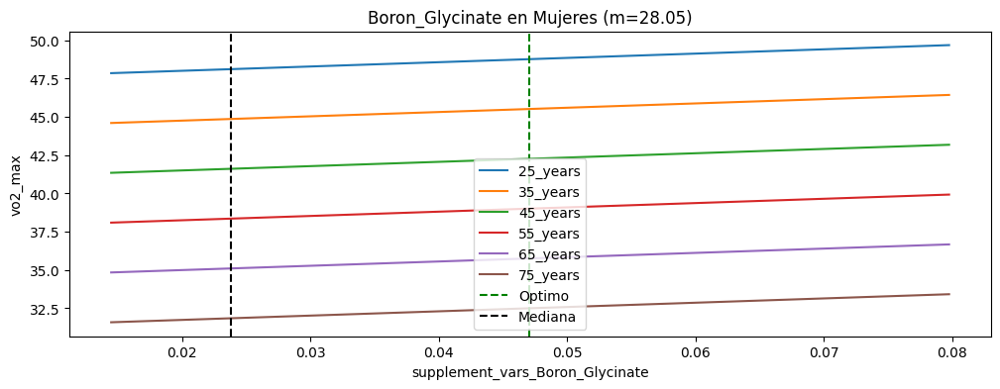

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


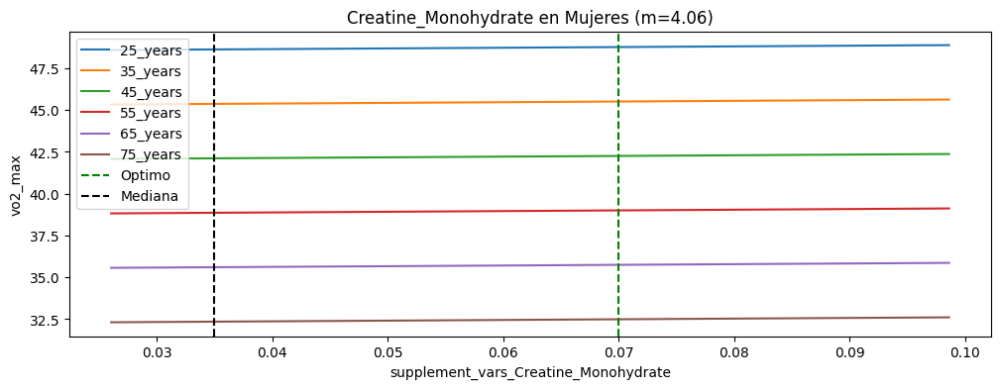

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


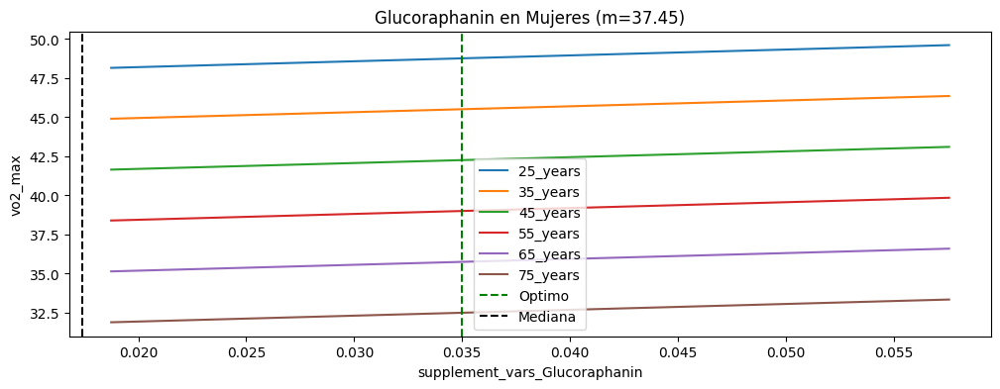

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


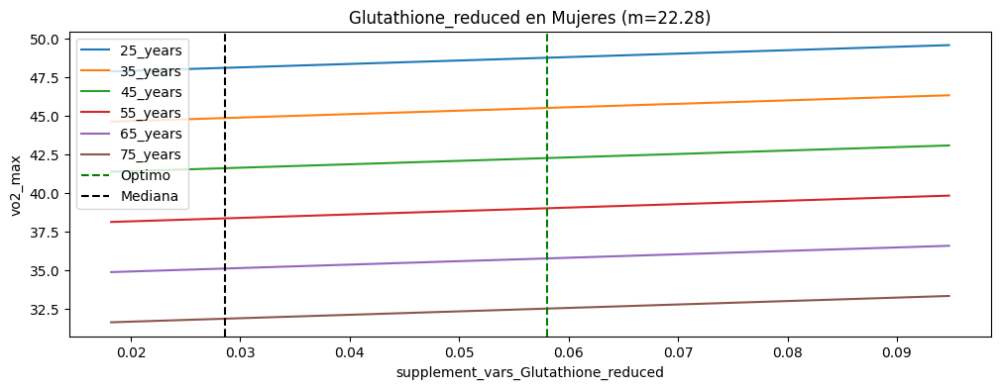

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


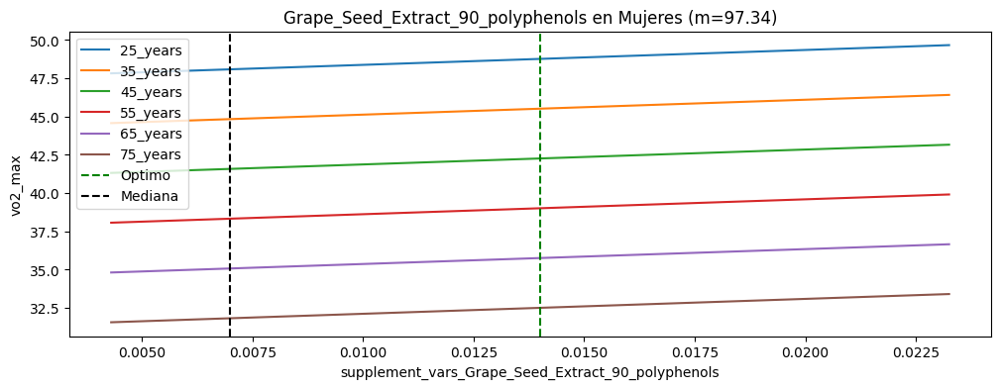

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


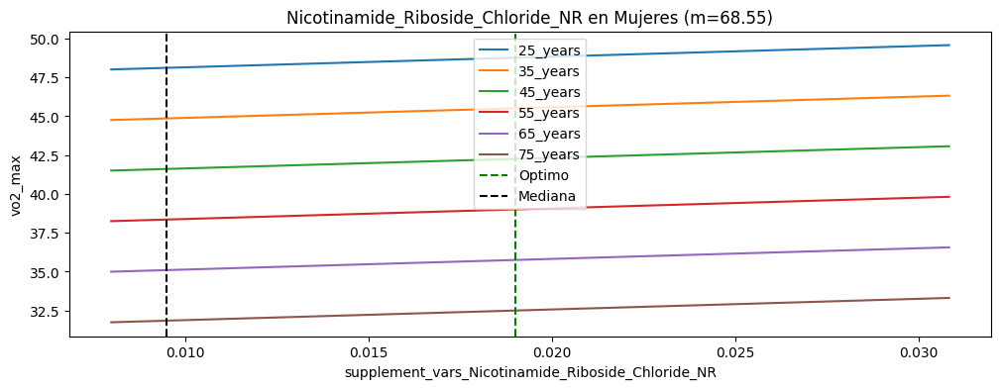

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


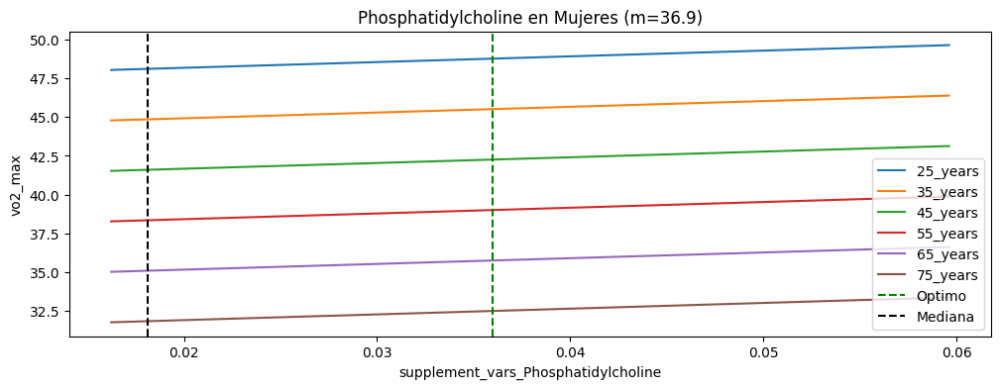

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


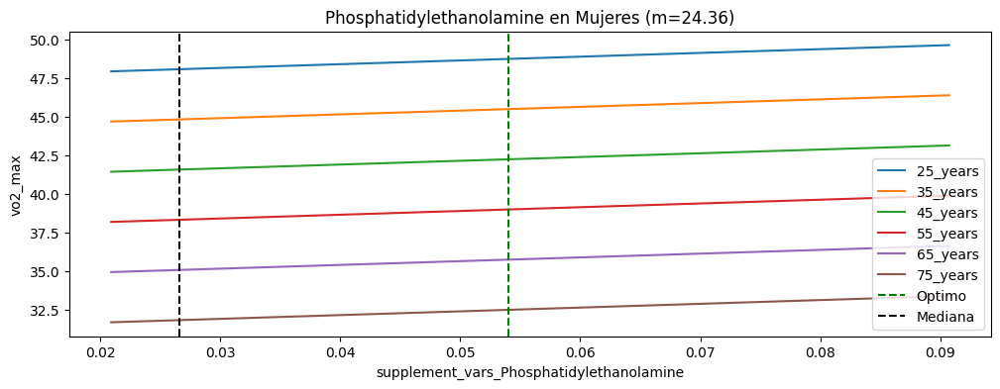

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


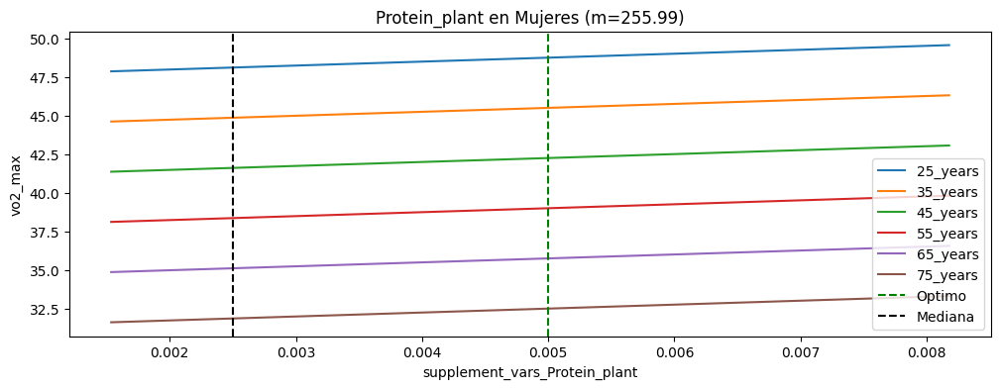

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


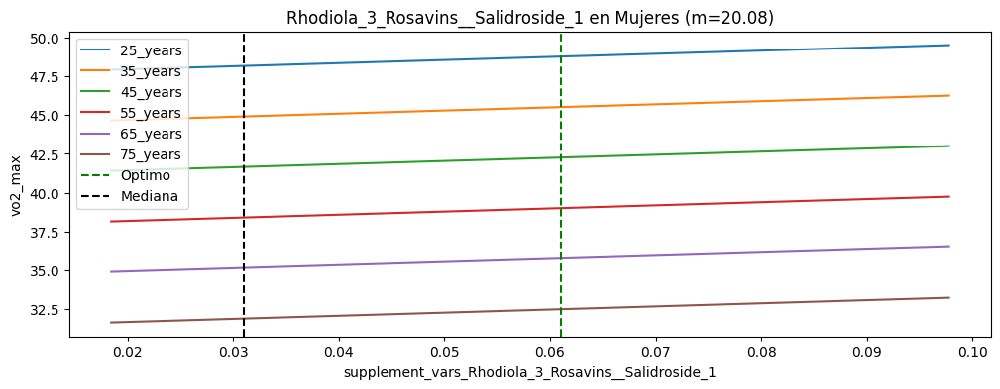

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


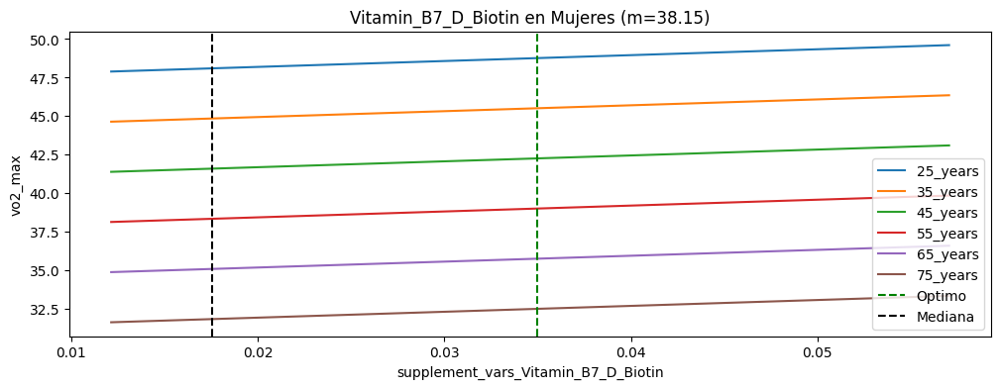

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


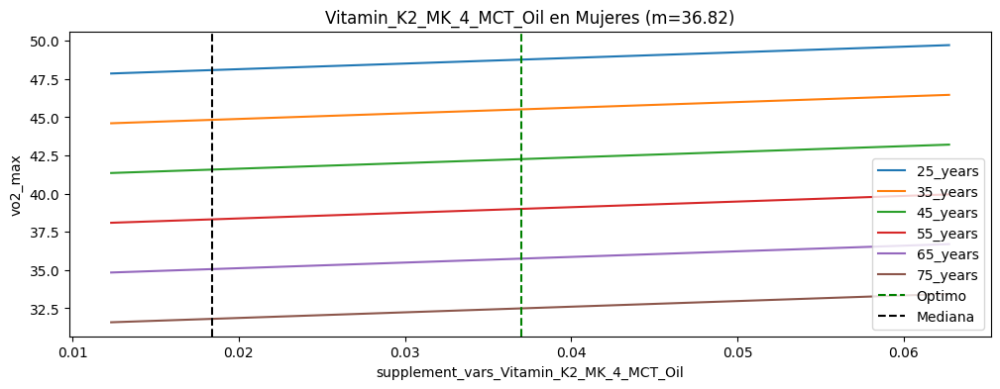

In [137]:
import matplotlib.pyplot as plt
import numpy as np

model_features_f = final_model_f.params.index.to_list()
model_features_f.remove('Intercept')
model_features_f.remove('personal_data_age')

for column_test in model_features_m:
    # Supongamos que este es el valor de la mediana de tu muestra
    mediana = df_health_optimal[column_test]  # Puedes ajustar esto según tu muestra real
    # Calcular el rango de valores
    limite_inferior = mediana * 0.3  # 70% menos de la mediana
    limite_superior = mediana * 1.7  # 70% más de la mediana
    # Generar 10 valores aleatorios entre el 30% menos de la mediana
    valores_inferiores = np.random.uniform(low=limite_inferior, high=mediana, size=10)
    # Generar 10 valores aleatorios entre el 30% más de la mediana
    valores_superiores = np.random.uniform(low=mediana, high=limite_superior, size=10)
    # Unir ambos arrays para tener los 20 valores
    valores_totales = np.sort(np.concatenate((valores_inferiores, mediana, valores_superiores)))

    ages_to_test_list = [25, 35, 45, 55, 65, 75]
    df_f_test_results = pd.DataFrame(data=valores_totales, columns=[column_test])

    for selected_age in ages_to_test_list:
        df_health_optimal['personal_data_age'] = selected_age

        df_test = pd.concat([df_health_optimal] * len(valores_totales), ignore_index=True)
        df_test[column_test] = valores_totales

        df_test_const = sm.add_constant(df_test)
        vo2_max_f_test = final_model_f.predict(df_test_const)

        df_f_test_results[f'{selected_age}_years'] = vo2_max_f_test

    
    # Gráfico para visualizar la distribución
    # Crear una figura con dos subplots
    fig, ax = plt.subplots(1, 1, figsize=(12, 4))
    pendiente_f = (final_model_f.predict(sm.add_constant(df_test).iloc[10]).values[0] - final_model_f.predict(sm.add_constant(df_test).iloc[9]).values[0]) / (valores_totales[10] - valores_totales[9])

    # Primer subplot para la distribución
    df_f_test_results.plot.line(x=column_test, ax=ax)
    # Añadir una línea de referencia vertical
    ax.axvline(x=[mediana], color='green', linestyle='--', label='Optimo')
    ax.axvline(x=df_health_women[column_test].median(), color='black', linestyle='--', label='Mediana')
    ax.set_title(f'{column_test.replace('fitness_data_', '').replace('supplement_vars_', '')} en Mujeres (m={round(pendiente_f, 2)})')
    ax.set_ylabel('vo2_max')
    ax.set_xlabel(column_test)
    ax.legend()

    plt.show()
    

## 4.5 Comportamiento de las variables predictoras en Hombres segun mediana de los datos

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


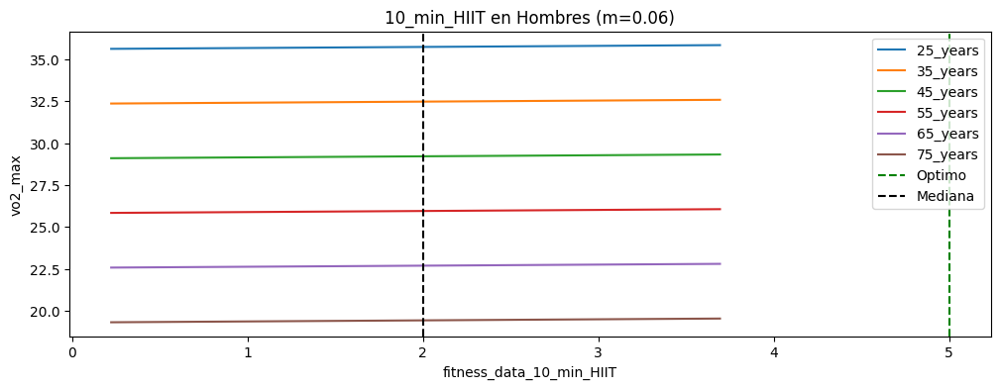

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


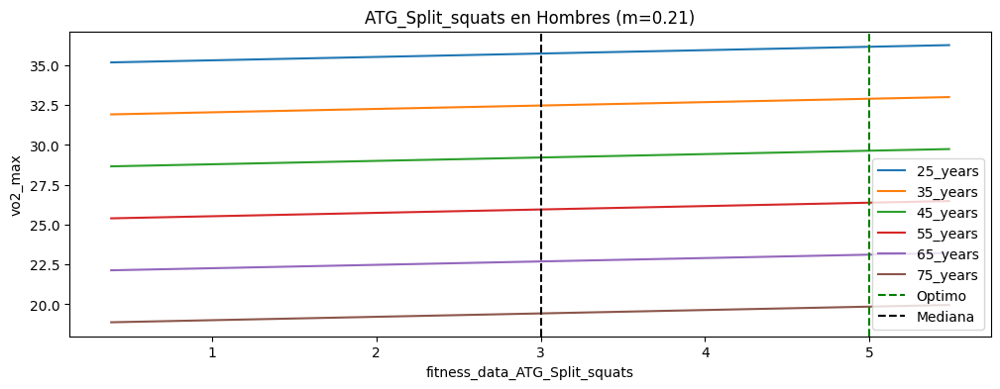

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


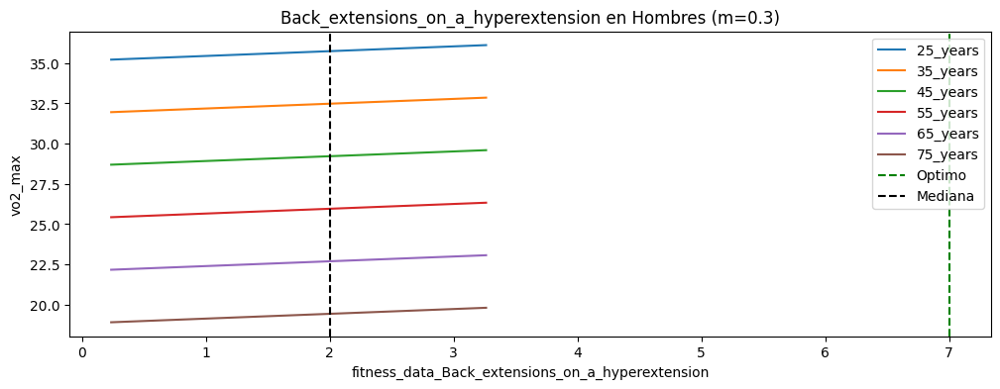

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


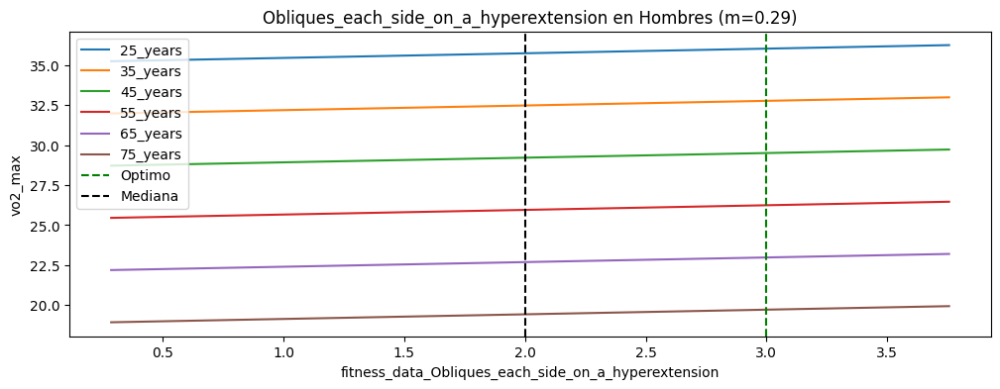

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


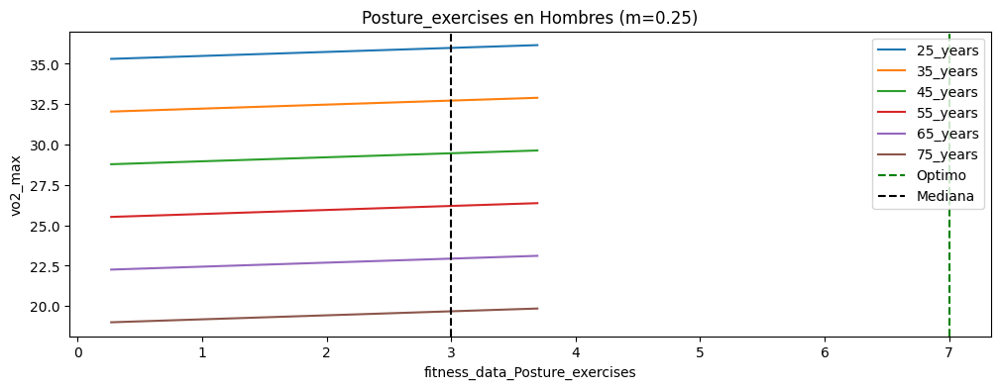

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


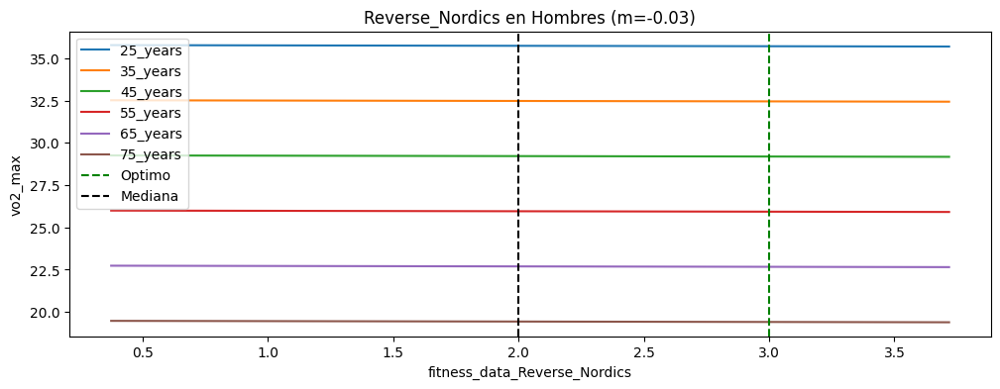

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


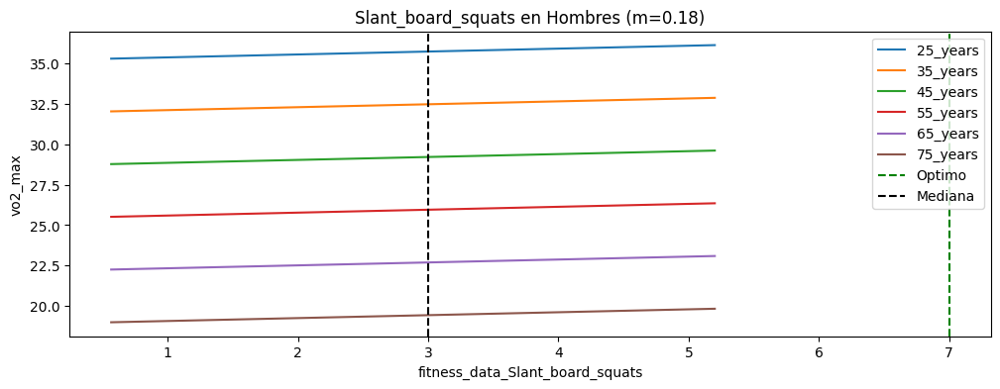

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


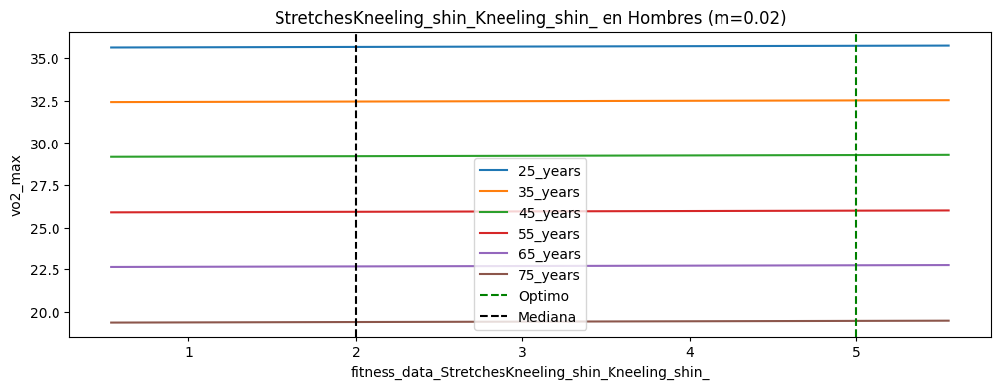

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


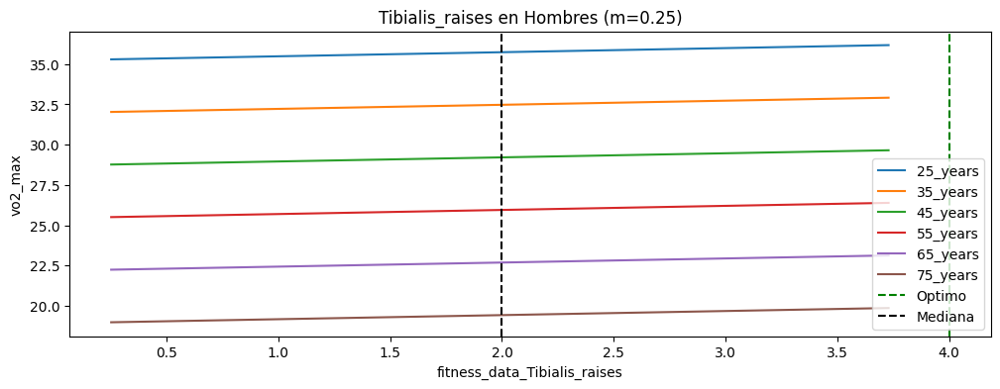

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


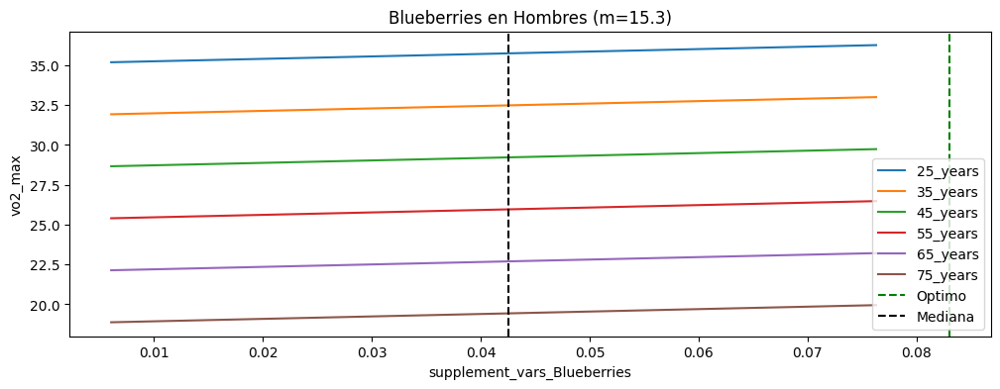

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


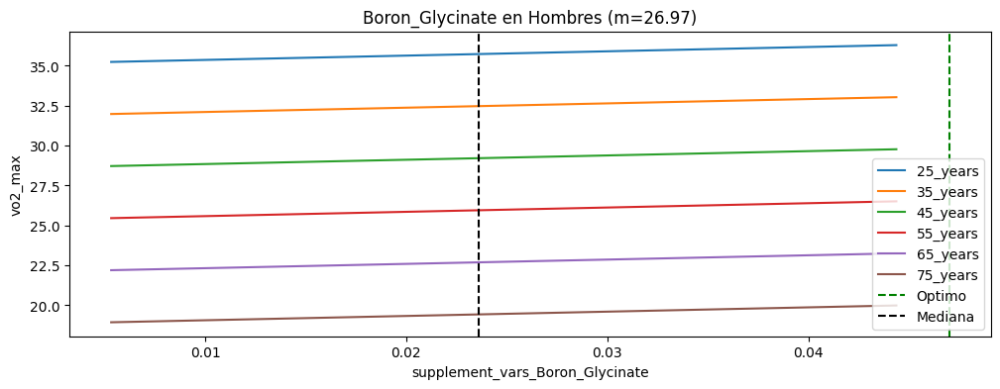

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


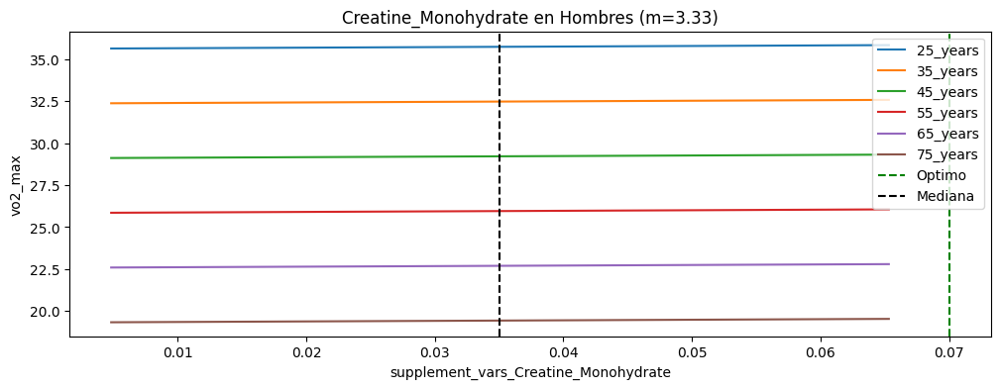

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


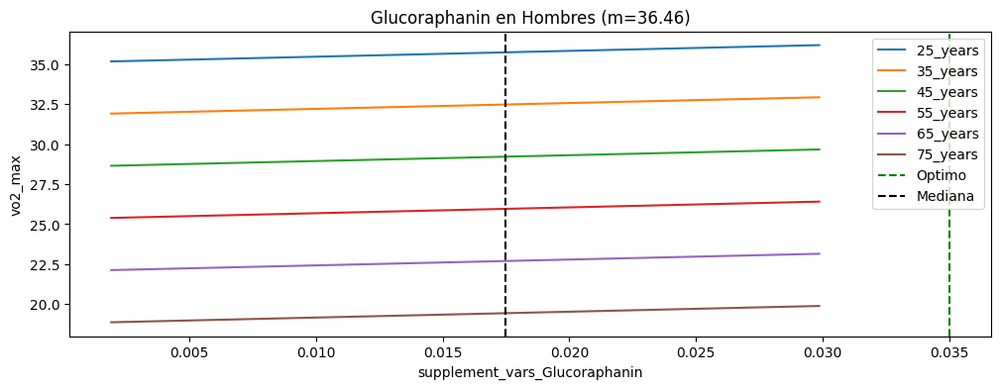

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


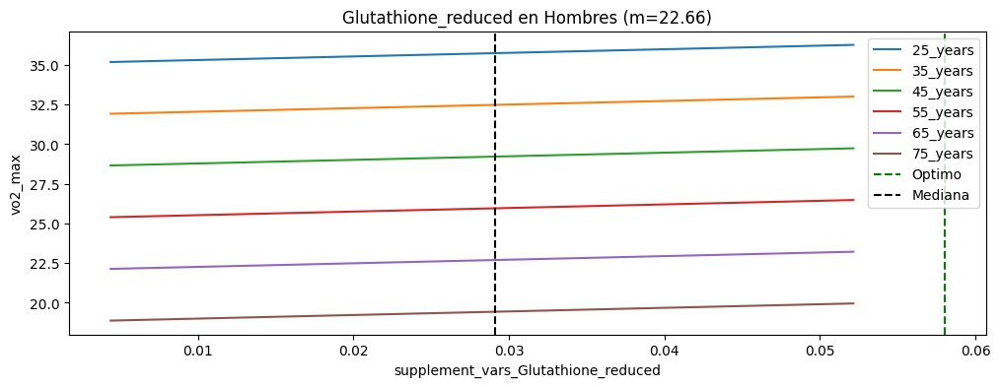

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


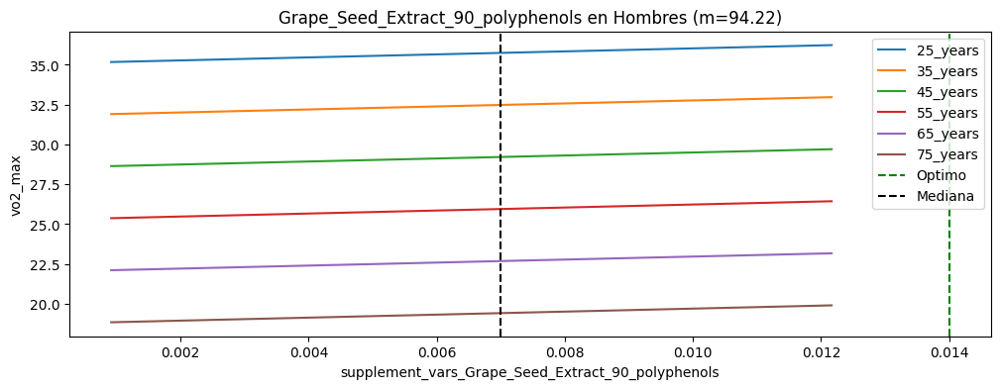

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


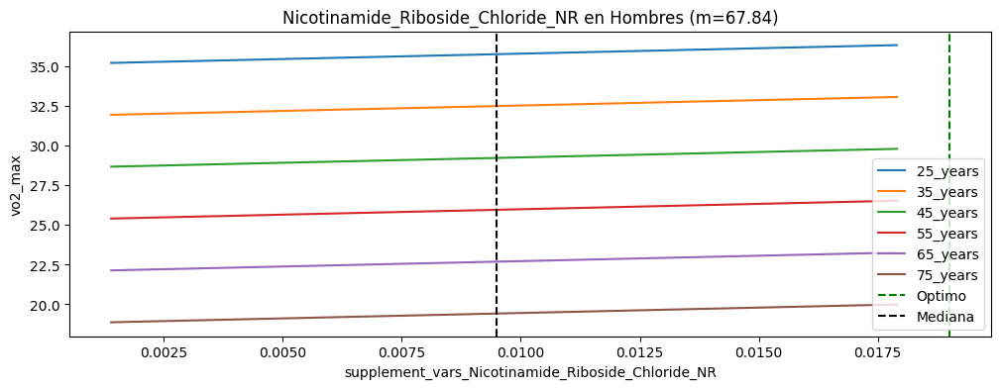

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


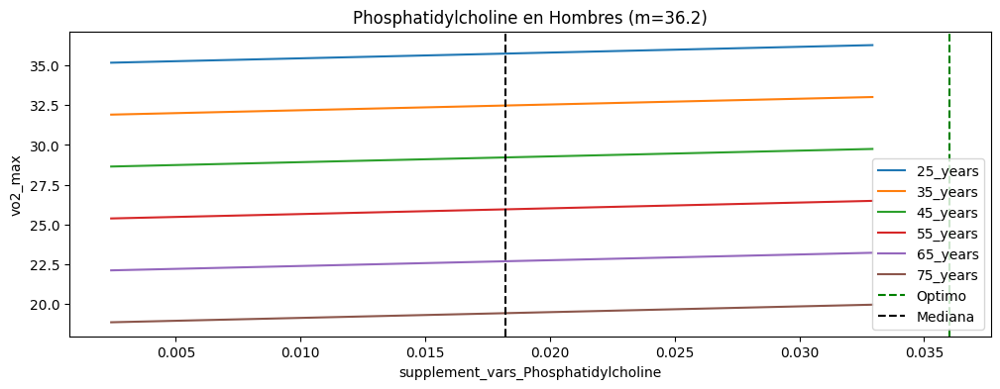

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


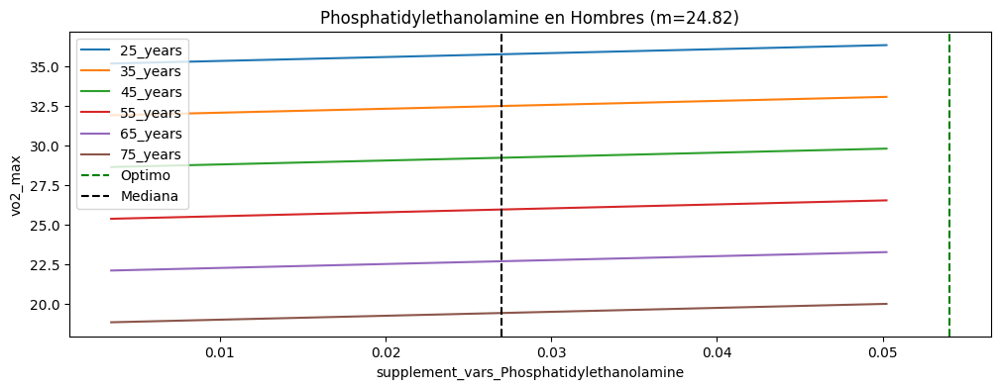

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


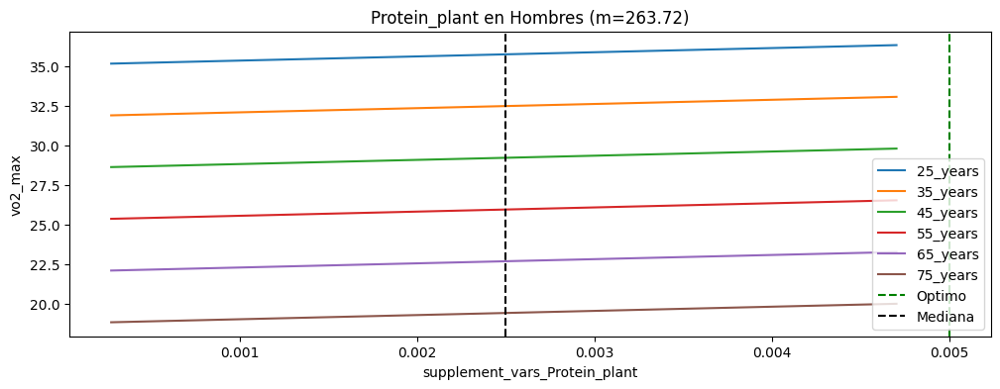

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


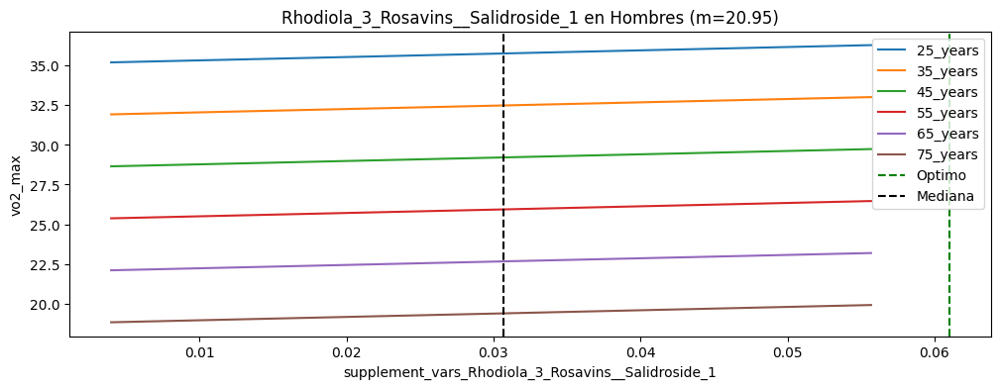

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


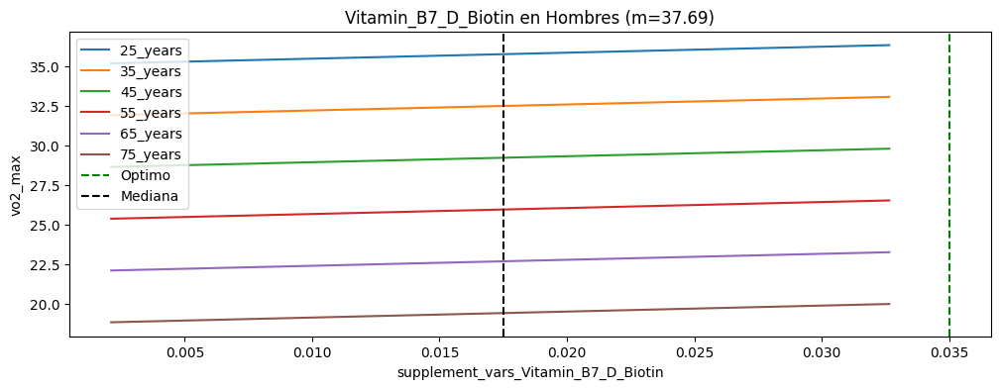

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


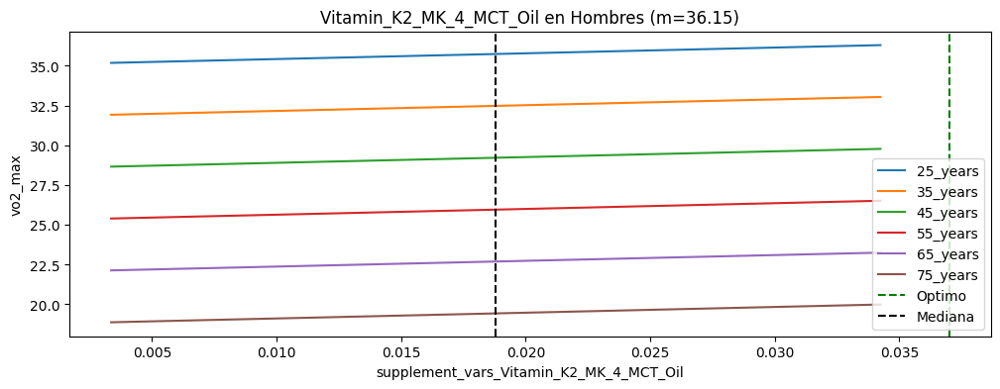

In [138]:
import matplotlib.pyplot as plt
import numpy as np

model_features_m = final_model_m.params.index.to_list()
model_features_m.remove('Intercept')
model_features_m.remove('personal_data_age')

df_health_median = df_health[model_features_m].median()

for column_test in model_features_m:
    # Supongamos que este es el valor de la mediana de tu muestra
    mediana = df_health_median[column_test]  # Puedes ajustar esto según tu muestra real
    # Calcular el rango de valores
    limite_inferior = mediana * 0.1  # 90% menos de la mediana
    limite_superior = mediana * 1.9  # 90% más de la mediana
    # Generar 10 valores aleatorios entre el 30% menos de la mediana
    valores_inferiores = np.random.uniform(low=limite_inferior, high=mediana, size=10)
    # Generar 10 valores aleatorios entre el 30% más de la mediana
    valores_superiores = np.random.uniform(low=mediana, high=limite_superior, size=10)
    # Unir ambos arrays para tener los 20 valores
    valores_totales = np.sort(np.concatenate((valores_inferiores, [mediana], valores_superiores)))

    ages_to_test_list = [25, 35, 45, 55, 65, 75]
    df_m_test_results = pd.DataFrame(data=valores_totales, columns=[column_test])

    for selected_age in ages_to_test_list:
        df_health_median['personal_data_age'] = selected_age

        df_test = pd.concat([df_health_median.to_frame().T] * len(valores_totales), ignore_index=True)
        df_test[column_test] = valores_totales

        df_test_const = sm.add_constant(df_test)

        vo2_max_m_test = final_model_m.predict(df_test_const)

        df_m_test_results[f'{selected_age}_years'] = vo2_max_m_test

    
    # Gráfico para visualizar la distribución
    # Crear una figura con dos subplots
    fig, ax = plt.subplots(1, 1, figsize=(12, 4))
    pendiente_m = (final_model_m.predict(sm.add_constant(df_test).iloc[10]).values[0] - final_model_m.predict(sm.add_constant(df_test).iloc[9]).values[0]) / (valores_totales[10] - valores_totales[9])

    # Primer subplot para la distribución
    df_m_test_results.plot.line(x=column_test, ax=ax)
    # Añadir una línea de referencia vertical
    ax.axvline(x=[df_health_optimal[column_test]], color='green', linestyle='--', label='Optimo')
    ax.axvline(x=df_health_men[column_test].median(), color='black', linestyle='--', label='Mediana')
    ax.set_title(f'{column_test.replace('fitness_data_', '').replace('supplement_vars_', '')} en Hombres (m={round(pendiente_m, 2)})')
    ax.set_ylabel('vo2_max')
    ax.set_xlabel(column_test)
    ax.legend()

    plt.show()
    

## 4.6 Comportamiento de las variables predictoras en Mujeres segun mediana de los datos

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


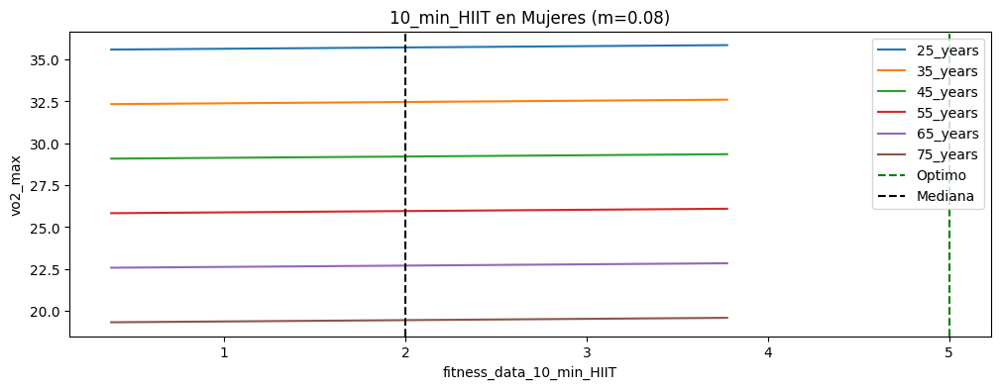

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


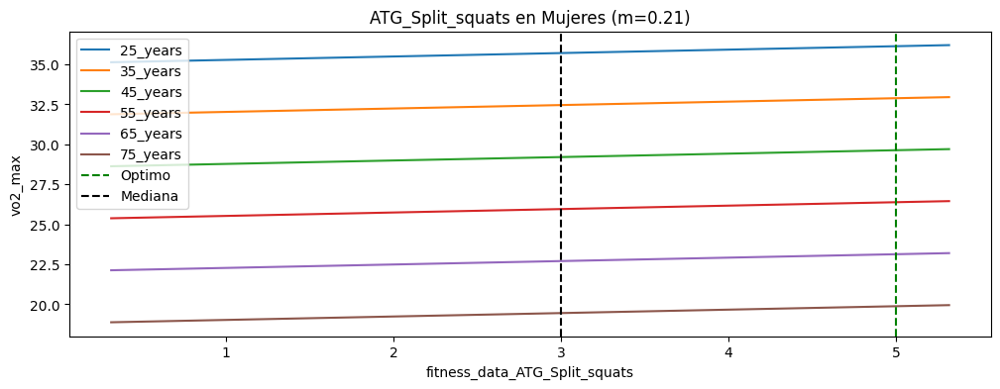

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


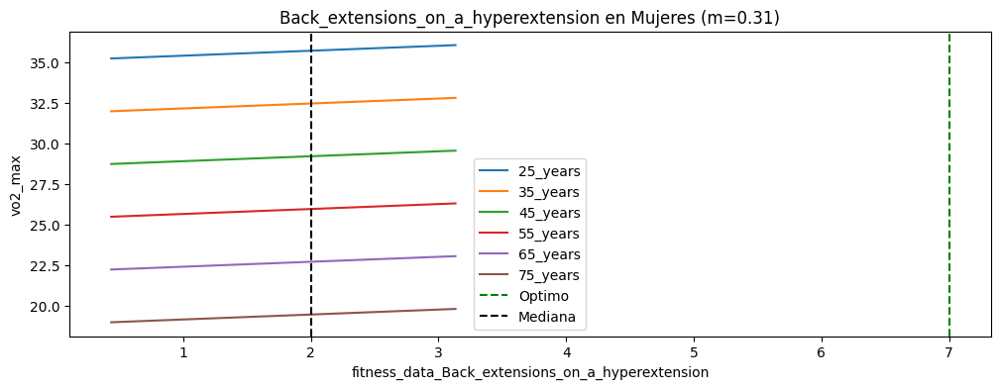

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


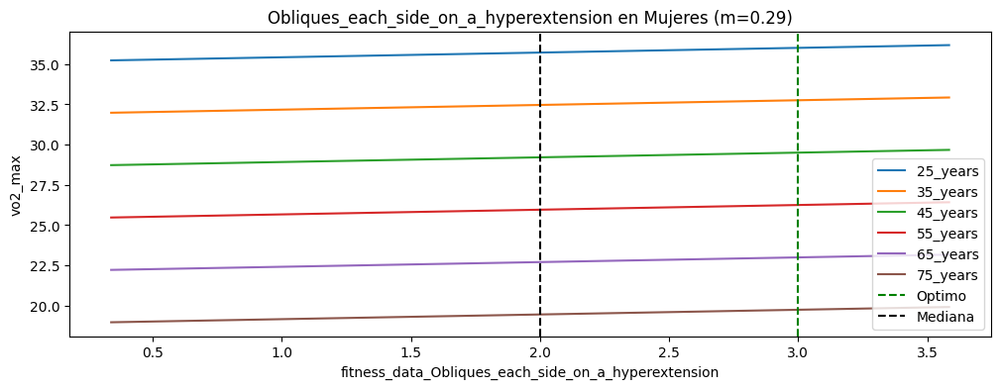

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


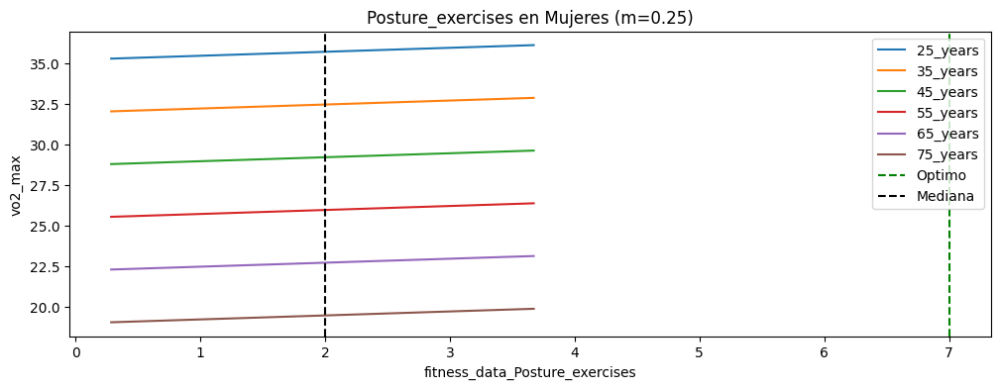

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


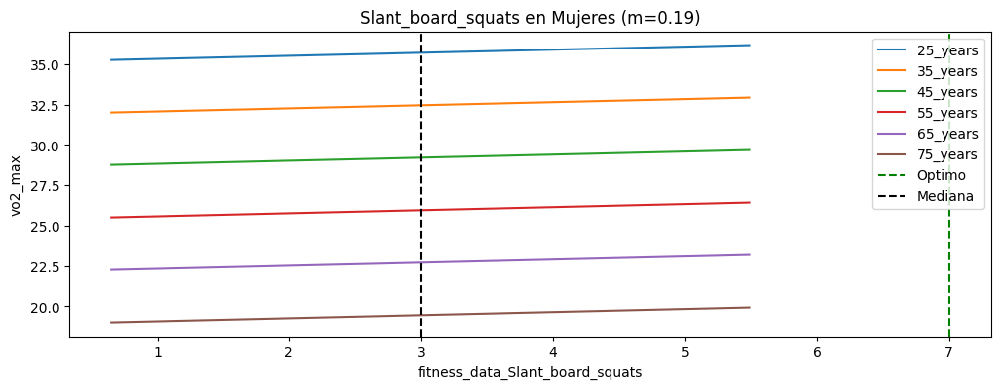

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


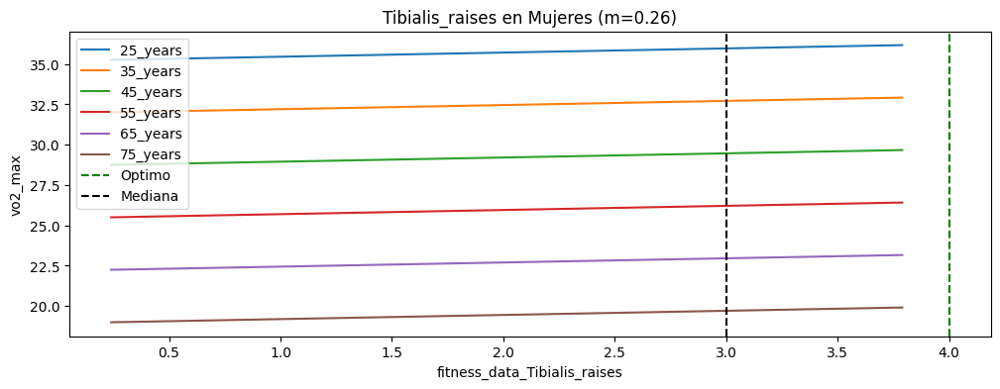

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


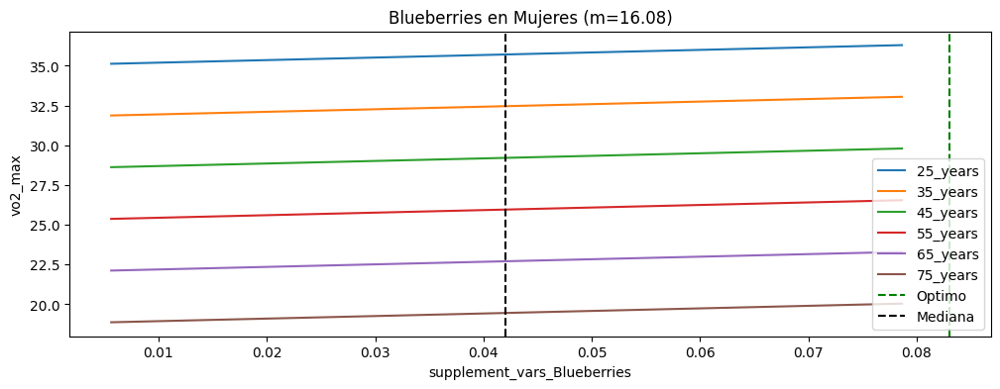

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


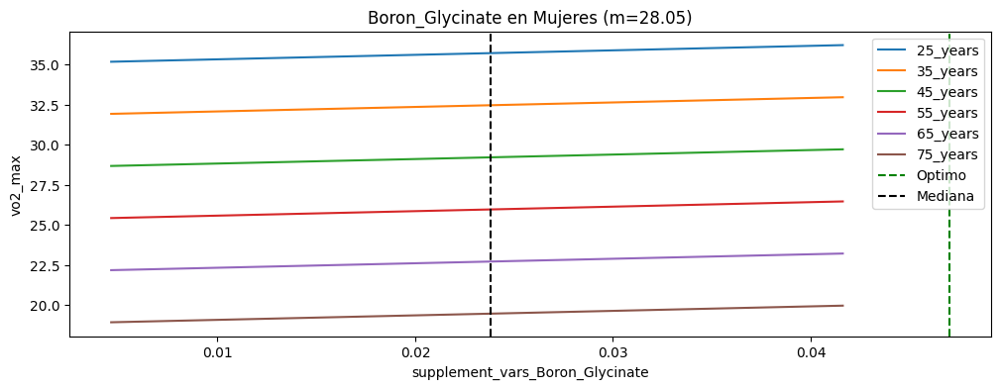

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


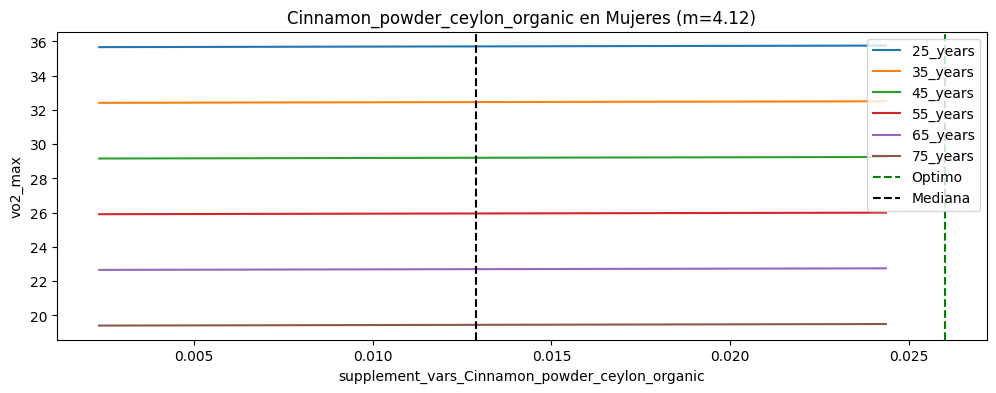

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


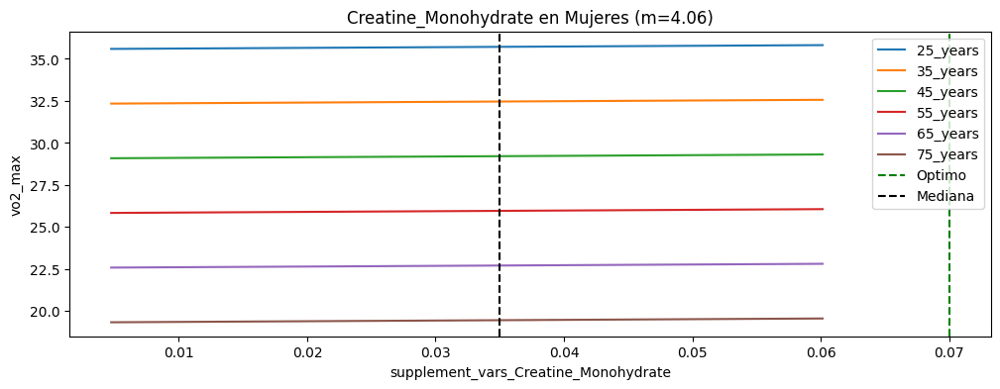

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


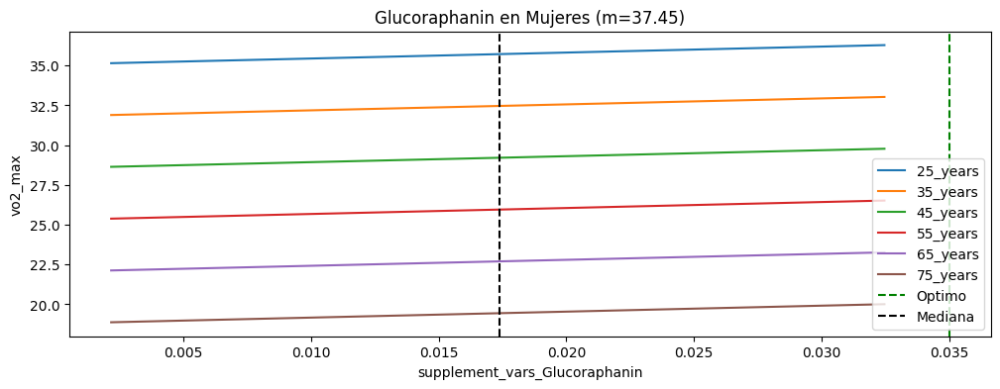

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


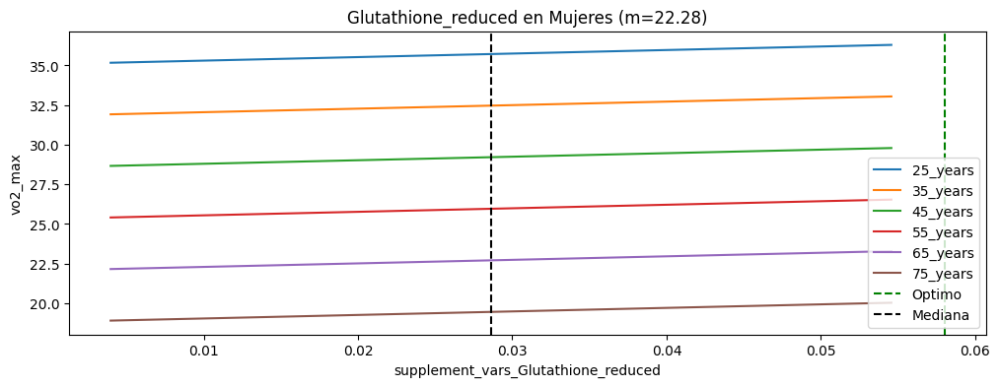

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


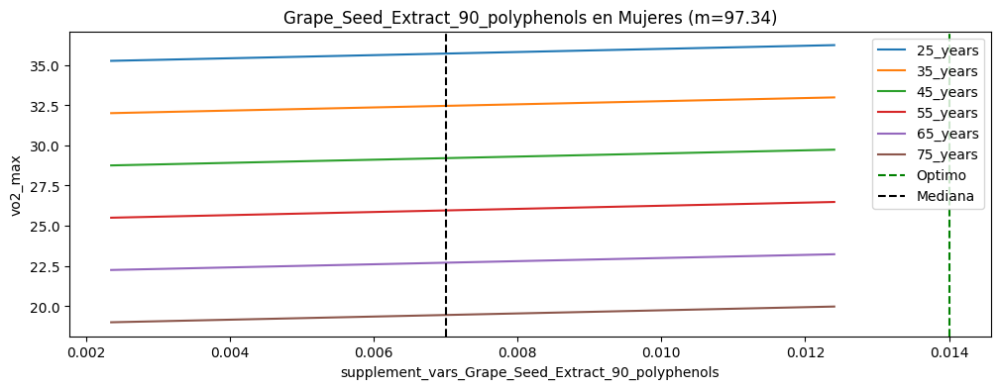

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


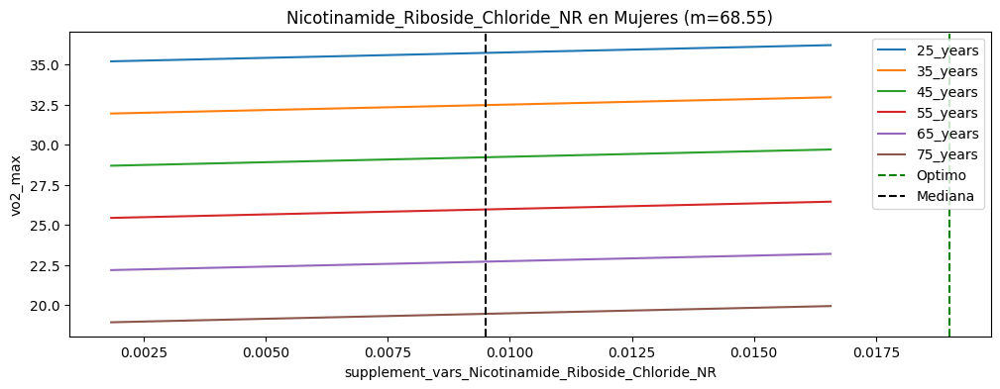

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


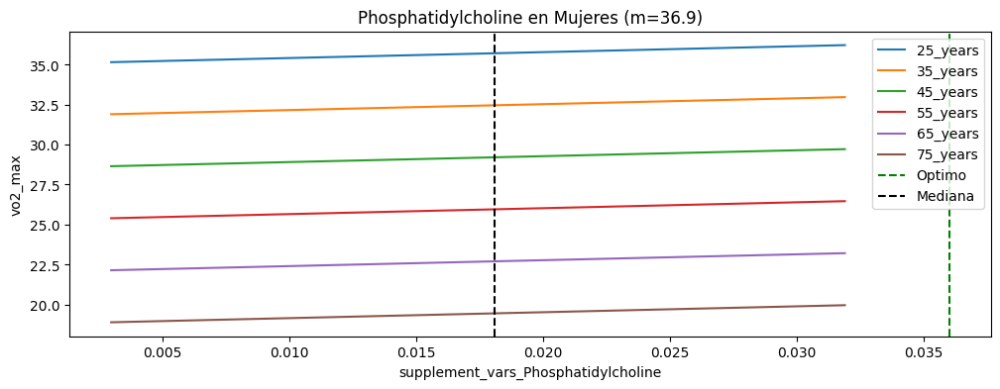

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


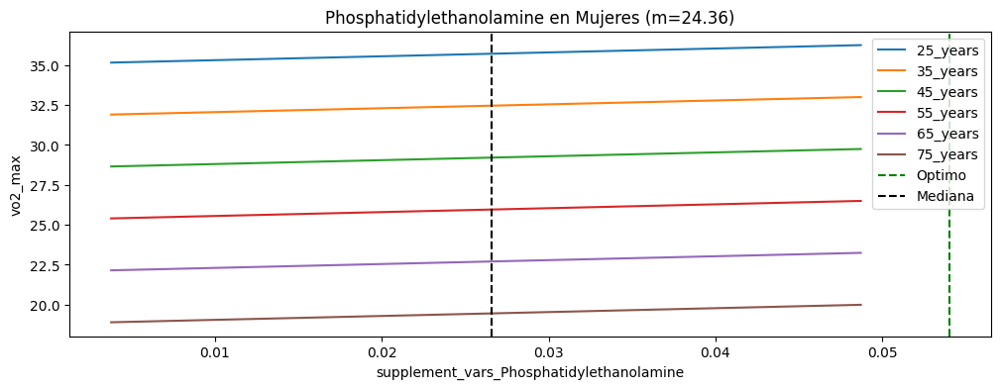

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


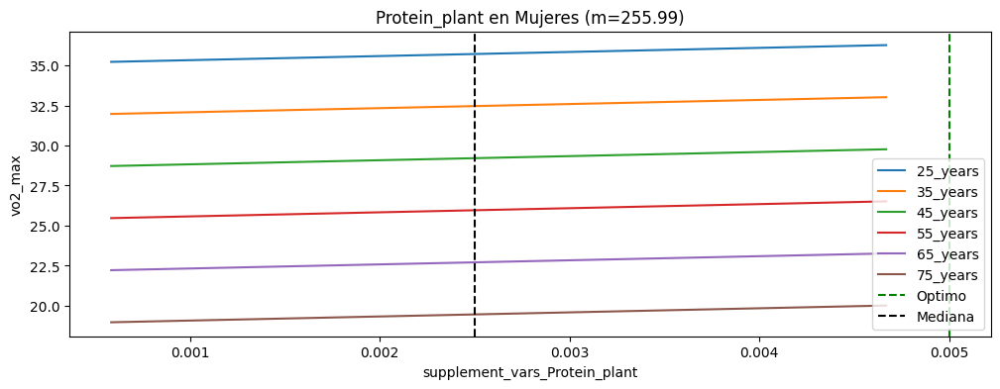

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


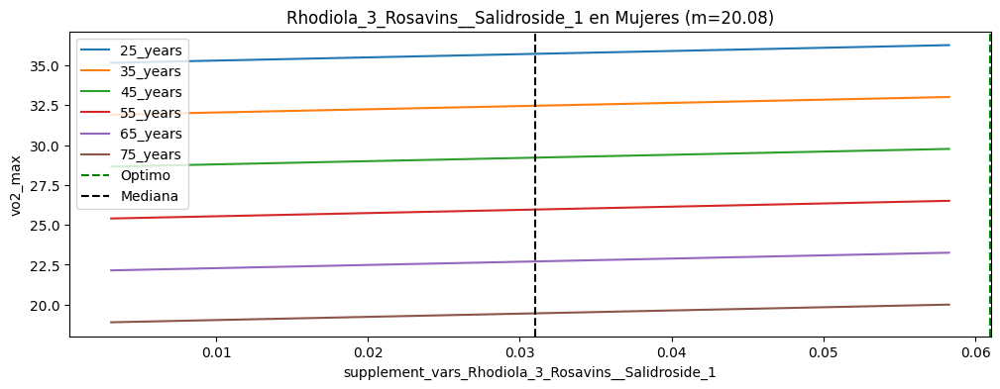

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


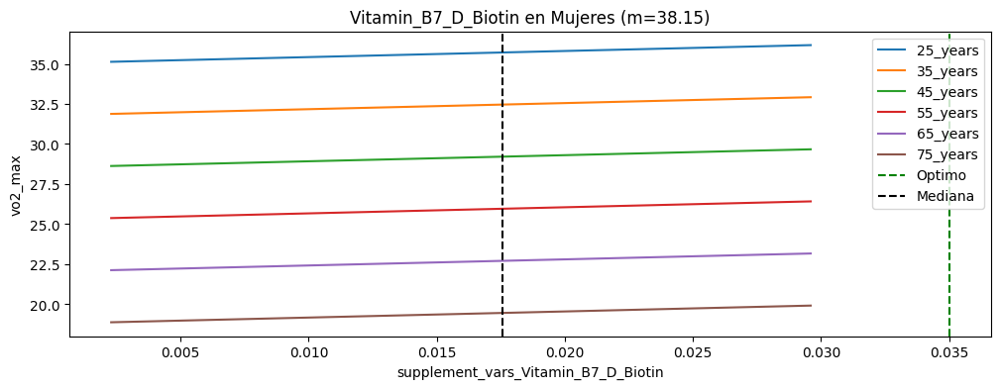

/Users/aquilesmartinez/miniconda3/lib/python3.12/site-packages/matplotlib/cbook.py:1762: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  return math.isfinite(val)


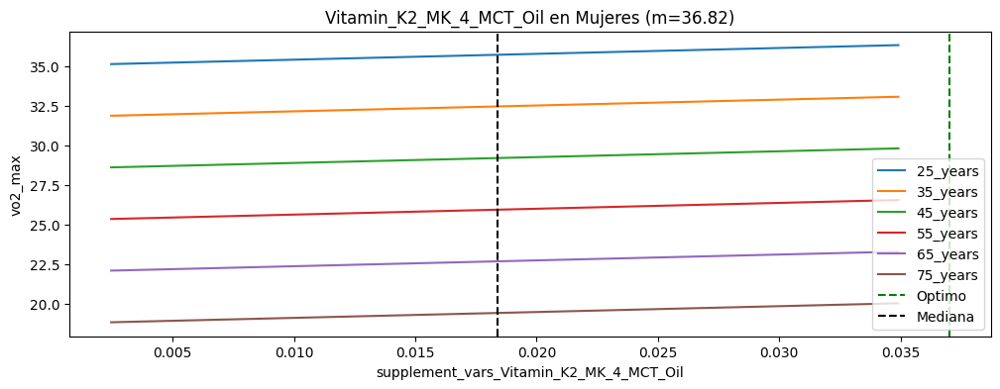

In [139]:
import matplotlib.pyplot as plt
import numpy as np

model_features_f = final_model_f.params.index.to_list()
model_features_f.remove('Intercept')
model_features_f.remove('personal_data_age')

df_health_median = df_health[model_features_f].median()

for column_test in model_features_f:
    # Supongamos que este es el valor de la mediana de tu muestra
    mediana = df_health_median[column_test]  # Puedes ajustar esto según tu muestra real
    # Calcular el rango de valores
    limite_inferior = mediana * 0.1  # 70% menos de la mediana
    limite_superior = mediana * 1.9  # 70% más de la mediana
    # Generar 10 valores aleatorios entre el 30% menos de la mediana
    valores_inferiores = np.random.uniform(low=limite_inferior, high=mediana, size=10)
    # Generar 10 valores aleatorios entre el 30% más de la mediana
    valores_superiores = np.random.uniform(low=mediana, high=limite_superior, size=10)
    # Unir ambos arrays para tener los 20 valores
    valores_totales = np.sort(np.concatenate((valores_inferiores, [mediana], valores_superiores)))

    ages_to_test_list = [25, 35, 45, 55, 65, 75]
    df_f_test_results = pd.DataFrame(data=valores_totales, columns=[column_test])

    for selected_age in ages_to_test_list:
        df_health_median['personal_data_age'] = selected_age

        df_test = pd.concat([df_health_median.to_frame().T] * len(valores_totales), ignore_index=True)
        df_test[column_test] = valores_totales

        df_test_const = sm.add_constant(df_test)

        vo2_max_f_test = final_model_f.predict(df_test_const)

        df_f_test_results[f'{selected_age}_years'] = vo2_max_f_test

    
    # Gráfico para visualizar la distribución
    # Crear una figura con dos subplots
    fig, ax = plt.subplots(1, 1, figsize=(12, 4))
    pendiente_f = (final_model_f.predict(sm.add_constant(df_test).iloc[10]).values[0] - final_model_f.predict(sm.add_constant(df_test).iloc[9]).values[0]) / (valores_totales[10] - valores_totales[9])

    # Primer subplot para la distribución
    df_f_test_results.plot.line(x=column_test, ax=ax)
    # Añadir una línea de referencia vertical
    ax.axvline(x=[df_health_optimal[column_test]], color='green', linestyle='--', label='Optimo')
    ax.axvline(x=df_health_women[column_test].median(), color='black', linestyle='--', label='Mediana')
    ax.set_title(f'{column_test.replace('fitness_data_', '').replace('supplement_vars_', '')} en Mujeres (m={round(pendiente_f, 2)})')
    ax.set_ylabel('vo2_max')
    ax.set_xlabel(column_test)
    ax.legend()

    plt.show()
    

# 5. Resultados

## 5.1 Histogramas

- La relacion entre la "edad" y "vo2_max" muestra un comportamiento descendente (pendiente negativa) pero si se observan los rangos etarios por separado, se puede ver que muestran un comportamiento creciente, similar al efecto Yule-Simpson o paradoja de Simpson. 

- Los valores de las columnas de suplementos tienen una distribucion uniforme y los valores de las columnas de fitness tienen una distribucion seudo normal.  

- Los valores de "vo2_max" tienen una distribucion con dos picos que pareciera ser la sobreposicion de dos distribuciones normales, una para muestras con valores bajos y otra para valores altos con medias bastante separadas entre si.

## 5.2 Correlaciones de Pearson

- Como era de esperar, despues de observar la relacion entre "edad" y "vo2_max", la correlacion entre estas dos columnas fue la más alta (0.94)

- Por otro lado, las correlaciones entre "vo2_max" y las demás columnas son muy bajas, siendo la siguiente despues de la "edad", el suplemento "Grape Seed Extract 90% polyphenols" con 0.064 de correlacion, y la que viene, el ejercicio "Tiabial Raises" con 0.067.

## 5.3 Modelamiento

- Se partio usando modelos de regresion lineal estadisticos de la libreria statsmodels, muy usada en R, para poder observar con precision los estadisticos del modelamiento y determinar la significancia de las variables independientes usadas, asi como la precision del modelo.

- Con todos los datos disponibles y filtrando las variables menos significativas (p value <0.01) se obtuvo un rendimiento cercano al 96% de R2 ajustado. En este modelo general se puede ver que la variable categorica del sexo se mantuvo para manipular a posterior el comportamiento del modelo con el sexo pero tenia baja significancia por lo que deberia haber sido filtrada.

- Para no tener el problema de que agregara ruido la variable categorica del sexo, se hicieron dos modelos, uno de hombres y otro de mujeres, para poder mantener la metodologia de solo conservar las variables significativas en cada modelo.

- El modelo de regresion lineal para hombres resultó con un rendimiento de 96% de R2 ajustado al igual que el modelo de regresion lineal para mujeres, manteniendo el rendimiento del modelo general. 

- Se probó escalando las variables independientes pero no se obtuvo un mejor rendimiento que los modelos anteriores.

- Lo bueno de un modelo con variables escaladas es que se pueden comparar los coeficientes del modelo para determinar las variables independientes más relevantes para el calculo de la variable dependiente.

- Segun el modelo para hombres con variables escaladas, los coeficientes mas relevantes fueron "edad" (-5.726), "Phosphatidylethanolamine" (0.387), "Vitamin K2 MK-4 MCT Oil" (0.386), "Grape Seed Extract 90% polyphenols" (0.382) y "Tibialis raises" (0.382).

- Segun el modelo para mujeres con variables escaladas, los coeficientes mas relevantes fueron "edad" (-5.787), "Vitamin K2 MK-4 MCT Oil" (0.393), "Grape Seed Extract 90% polyphenols" (0.392), "Slant board squats" (0.391) y "Tibialis raises" (0.387).

- Además, se probaron modelos fuera de la libreria statsmodels, usando sklearn y XGBoost. Se uso un modelo de regresion logistica multiclase con el que se obtuvo un rendimiento cercano al 75% de F1-Score y un modelo XGBoost (Boosting de arboles de decision) con un rendimiento cercano al 99% de F1-Score.

- El modelo de XGBoost al ser un modelo basado en arboles de decision se pueden obtener las importancias de las variables, donde las más importantes fueron "edad" (0.04136), "ATG Split squats" (0.02367), "Back extensions (on a hyperextension)" (0.021933), "Posture exercises" (0.021204), "Slant board squats" (0.01969) y "Tibialis raises" (0.01968).

- Se observa que el modelamiento con XGBoost tienen mejor rendimiento que los modelos de regresion lineal pero solo un 3%, por lo que se optó por elegir a los modelos de regresion lineal debido a que pueden ser mejor explicados desde un punto de vista estadistico y es más sencillo de explicar.

## 5.4 Graficos de comportamiento parcial (Partial Leverage Plot)

- Se obtuvieron los graficos de comportamiento parcial o Partial Leverage Plot para estudiar el comportamiento de la variable dependiente con una variable indpendiente tanto en hombres como en mujeres.

- A nivel general se ve que la mediana de los datos para cada columna o variable esta bastante alejada del optimo propuesto, lo que podría indicar que no se esta siguiendo el protocolo como se espera disminuyendo el beneficio en la reduccion del envejecimiento del protocolo.

- Segun el modelo de regresion lineal para hombres, las variables que permitiran obtener un mayor vo2_max (una más rapida reduccion del envejecimiento) son 
    - Fitness
        - Back extensions (on a hyperextension) (pendiente = 0.30)
        - Obliques (each side, on a hyperextension) (pendiente = 0.29)
        - Tibialis raises (pendiente = 0.25)
        - Posture exercises (pendiente = 0.25)
    - Suplementos
        - Protein (plant) (pendiente = 263.72)
        - Grape Seed Extract 90% polyphenols (pendiente = 94.22)
        - Nicotinamide Riboside Chloride (NR) (pendiente = 67.0)
        - Vitamin K2 MK-4 MCT Oil (pendiente = 36.15)
        
- Segun el modelo de regresion lineal para mujeres, las variables que permitiran obtener un mayor vo2_max (una más rapida reduccion del envejecimiento) son 
    - Fitness
        - Back extensions (on a hyperextension) (pendiente = 0.31)
        - Obliques (each side, on a hyperextension) (pendiente = 0.29)
        - Tibialis raises (pendiente = 0.26)
        - Posture exercises (pendiente = 0.25)
    - Suplementos
        - Protein (plant) (pendiente = 255.99)
        - Grape Seed Extract 90% polyphenols (pendiente = 97.34)
        - Nicotinamide Riboside Chloride (NR) (pendiente = 68.55)
        - Vitamin K2 MK-4 MCT Oil (pendiente = 36.82)

# 6. Conclusiones

- Se observo que el vo2_max del protocolo puede ser modelado con una regresion lineal con un alto rendimiento.

- Es ideal tener un modelo separado para hombres y mujeres debido a sus comportamientos diferentes frente a los ejercicios y suplementos indicados.

- Las personas que dieron sus datos para este estudio mostraron un comportamiento alejado frente al otpimo esperado para cada ejercicio y suplemento por lo que podría indicar que el protocolo es muy estricto o necesitan mas control los usuarios.

- A pesar de que la edad es lo que mas afecta en la disminucion de rendimiento mostrado en el vo2_max, correlacionado con un aumento del envejecimiento del cuerpo, algunos ejercicios o suplementos pueden ayudar a mejorar el rendimiento de vo2_max.

- Los elementos del protocolo que mas aportan en disminuir la vejez, al aumentar el vo2_max, es por lejos consumir suplementos alimenticios, siendo la Protein (plant) la que mas aporta al aumentar su dosis, pero tambien hay ejercicios que colaboran con la disiminucion de la vejez corporal, como las Back extensions.

- Se puede postular que al consumir mas proteina y hacer mas ejercicios que fortalezcan el core permitiran tener una mejor musculatura, logrando tener una vida más activa y menos problemas de movilidad, pero esto tiene que ser confirmado con una muestra más grande, con un monitoreo más amplio de variables y sus cambios a traves del tiempo.

- En terminos de genero, no se ven diferencias notables entre hombres y mujeres respecto a los efectos del protocolo en el vo2_max.

- Se evaluo el rendimiento de los modelos principalmente con los datos totales pero tambien se hicieron pruebas de rendimiento sobre los datos parciales, lo que nos indica que el modelo es suficientemente bueno con datos vistos como no vistos. Esto es relevante al momento de poner este modelo en produccion ya que podría mantenerse activo por bastante tiempo, ahorrando el costo de recursos y tiempos de desarrollo de nuevos modelos con datos nuevos.

- Un buen enfoque para dejar un modelo como este en produccion seria aplicar MLOps para poder tener un monitoreo continuo del rendimiento del modelo a traves del tiempo y reentrenarlo cuando su rendimiento disminuya bajo lo esperado. 

- Al usar un modelo simple como una regresion lineal, este modelo podria estar en produccion obteniendo predicciones en near real time, con la posibilidad de obtener la explicabilidad de las inferencias obtenidas desde este modelo. 